In [1]:
from scipy.optimize import root_scalar, root
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from decimal import Decimal
from math import isclose
import sys
sys.path.append(r'/home/christian/Documents/Bachelor/numerics/')
from physical_functions_mf import *
import matplotlib.ticker as ticker
import matplotlib.gridspec as gridspec
cm = 1/2.54  
width = 12*cm 

In [2]:
# physical functions


def AOK(k,Gam,sgam):
    return Gam*(Gam+sgam-k)

def minF(w,k,G,gamma):
    if k>0:
        if k>G+gamma:
            if w!=0:
                return (2*w-np.sqrt(w**2-3/2*AOK(k,G,gamma)))/3/k
            else:
                return -np.sqrt(-G/2*(G+gamma-k)/k**2)*0.9
        else:
            return 0
               
    else:
        return -w*G/2/(G/2*(G+gamma)+w**2)
def maxF(w,k,G,gamma):
    if k>0:
        return (2*w+np.sqrt(w**2-3/2*AOK(k,G,gamma)))/3/k
    else:
        if w==0:
            return 0#(2-np.sqrt(1-3/2*10**8*AOK(k,G,gamma)))/3
        else:
            return (2+np.sqrt(1-3/2/w**2*AOK(k,G,gamma)))/3*w*10**5

# def lamtest(y,w,k,Gam,sgam):
#     A = AOK(k,Gam,sgam)
#     p = Gam**2/w**2+A/w**2/2+3*y**2-4*y+1
#     q = Gam**2/w**2*(A/w**2/2+3*y**2-4*y+1)+Gam**2/k**2*(2*y-k/w)*(y-k/w)
#     return p, p**2-4*q
    # return (-p+np.sqrt(p**2-4*q))/2, p,p**2-4*q

def lamtest(y,w,k,Gam,sgam):
    A = AOK(k,Gam,sgam)
    p = Gam**2+A/2+k**2*y**2-y*w*k
    q = Gam**2*(A/2+k**2*y**2-y*w*k)+Gam**2*(2*y*k-w)*(y*k-w)
    return p, p**2-4*q, q


def BK(W,K):
    return K/2/W**2

def yKnax(W,K):
    return (2+np.sqrt(1-3/2*(1-K)/W**2))/3
def yKnix(W,K):
    return (2-np.sqrt(1-3/2*(1-K)/W**2))/3
def FKK(W,K):
    return -BK(W,K)+yKnax(W,K)**3*2-2*yKnax(W,K)**2

def Foriginal_vec(p,w,k,delta,Gamma,gamma):
    x=p[0]
    y= p[1]
    eqx = -Gamma*delta*y-AOK(k,Gamma,gamma)*x-2*k**2*x*(x**2+y**2)+2*w*k*x*y
    eqy = Gamma*delta*x-w*Gamma-AOK(k,Gamma,gamma)*y-2*k**2*y*(x**2+y**2)+2*k*w*(x**2+2*y**2)-2*w**2*y
    return np.array([eqx,eqy])
def Foriginal(y,w,k,Gamma,gamma):
    return -w*Gamma/2-Gamma/2*(Gamma+gamma-k)*y-k**2*y**3+2*w*k*y**2-w**2*y
# def y1ofx(x,w,k,delta,Gamma,gamma):
#     if x==0:
#         return 0
#     return 1/(2*k**2*x)*(k*w*x-Gamma*delta/2+np.sqrt((k*w*x-Gamma*delta/2)**2-4*x*k**2*(k**2*x**3+AOK(k,Gamma,gamma)/2*x)))

def y1ofx(x,w,k,delta,Gamma,gamma):
    if x==0 and delta==0:
        return (2*w**2+np.sqrt(4*w**4+8*k*Gamma*w**2))/(4*k*w)
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return 1/(Gamma*delta+2*k*w*x)*(w**2*x+np.sqrt(w**4*x**2-(2*k*w*x+Gamma*delta)*(2*k*w*x**3-w*Gamma*x+Gamma*delta*x**2)))

def num(x,w,k,delta,Gamma,gamma):
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return (w**2*x+(w**4*x**2-(2*k*w*x+Gamma*delta)*(2*k*w*x**3-w*Gamma*x+Gamma*delta*x**2)).sqrt())

def denom(x,w,k,delta,Gamma,gamma):
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return Gamma*delta+2*k*w*x

def insq(x,w,k,delta,Gamma,gamma):
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return (w**4*x**2-(2*k*w*x+Gamma*delta)*(2*k*w*x**3-w*Gamma*x+Gamma*delta*x**2))
    # return (k*w*x-Gamma*delta/2)**2-4*x*k**2*(k**2*x**3+AOK(k,Gamma,gamma)/2*x)

def insq_preci(x,w,k,delta,Gamma,gamma):
    x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return (w**4*x**2-(2*k*w*x+Gamma*delta)*(2*k*w*x**3-w*Gamma*x+Gamma*delta*x**2))

def y2ofx(x,w,k,delta,Gamma,gamma):
    if x==0 and delta==0:
        return (2*w**2-np.sqrt(4*w**4+8*k*Gamma*w**2))/(4*k*w)
    # x,w, k, delta, Gamma , prec2 = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(2)
    prec2=2
    return 1/(Gamma*delta+prec2*k*w*x)*(w**prec2*x-np.sqrt(w**4*x**prec2-(prec2*k*w*x+Gamma*delta)*(prec2*k*w*x**3-w*Gamma*x+Gamma*delta*x**prec2)))
    # if x==0:
    #     return w/k
    # return 1/(2*k**2*x)*(k*w*x-Gamma*delta/2-np.sqrt((k*w*x-Gamma*delta/2)**2-4*x*k**2*(k**2*x**3+AOK(k,Gamma,gamma)/2*x)))
y1ofx_vec = np.vectorize(y1ofx)
y2ofx_vec = np.vectorize(y2ofx)
def Fx(x,w,k,delta,Gamma,gamma,s):
    if s==1:
        y = y1ofx(x,w,k,delta,Gamma,gamma)
    if s==2:
        y = y2ofx(x,w,k,delta,Gamma,gamma)
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return Gamma*delta*x-w*Gamma-AOK(k,Gamma,gamma)*y-2*k**2*y*(x**2+y**2)+2*k*w*(x**2+2*y**2)-2*w**2*y

def Fx2(x,w,k,delta,Gamma,gamma,s):
    if s==1:
        y = y1ofx(x,w,k,delta,Gamma,gamma)
    if s==2:
        y = y2ofx(x,w,k,delta,Gamma,gamma)
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return -Gamma*delta*y-AOK(k,Gamma,gamma)*x-2*k**2*x*(x**2+y**2)+2*k*w*x*y
def Fx_vec(x,w,k,delta,Gamma,gamma,s):
    if s==1:
        y = y1ofx_vec(x,w,k,delta,Gamma,gamma)
    if s==2:
        y = y2ofx_vec(x,w,k,delta,Gamma,gamma)
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return Gamma*delta*x-w*Gamma-AOK(k,Gamma,gamma)*y-2*k**2*y*(x**2+y**2)+2*k*w*(x**2+2*y**2)-2*w**2*y

def Fx2_vec(x,w,k,delta,Gamma,gamma,s):
    if s==1:
        y = y1ofx_vec(x,w,k,delta,Gamma,gamma)
    if s==2:
        y = y2ofx_vec(x,w,k,delta,Gamma,gamma)
    # x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return -Gamma*delta*y-AOK(k,Gamma,gamma)*x-2*k**2*x*(x**2+y**2)+2*k*w*x*y

def eq(x,w,k,delta,Gamma,gamma,s):
    if s==1:
        y = y1ofx(x,w,k,delta,Gamma,gamma)
    if s==2:
        y = y2ofx(x,w,k,delta,Gamma,gamma)
    x,w, k, delta, Gamma , gamma = Decimal(x), Decimal(w), Decimal(k), Decimal(delta), Decimal(Gamma), Decimal(gamma)
    return -Gamma*delta*(y**2+x**2)+w*Gamma*x-2*k*w*x*(x**2+y**2)+2*w**2*x*y

def m_z(x,y,omega,kappa,Gamma):
    return 1/2 -(kappa*(y**2+x**2)-omega*y)/Gamma

def set_point1(p,w,k,delta,Gamma,gamma):
    n = 0
    while True:
        try:
            p+= n* 5/10**7
            if np.isnan(Fx(p,w,k,delta,Gamma,gamma,1)):
                n+=1
                continue
            else:
                n+=1
                # print(Fx(p,w,k,delta,Gamma,gamma,1))
                break
        except RuntimeWarning:
            n+=1
            pass
    return p

def set_point2(p,w,k,delta,Gamma,gamma):
    n = 0
    while True:
        try:
            p-= n* 5/10**7
            if np.isnan(Fx(p,w,k,delta,Gamma,gamma,1)):
                n+=1
                continue
            else:
                # print(Fx(p,w,k,delta,Gamma,gamma,1))
                n+=1
                break
        except RuntimeWarning:
            n+=1
            pass
    return p
            

def set_xgird(w,k,delta,Gamma,gamma,points=False):
    grid1 = np.linspace(-0.5-1/10**5,0.5+1/10**5,40)
    pos = 0
    p1= None
    p2 = None
    if max(insq(grid1,w,k,delta,Gamma,gamma))<0:# or min(insq(grid1,w,k,delta,Gamma,gamma))>0:
        # print('no solution')
        return np.array([-2]), None
    gridpoints = []
    newgrid = np.array([0])
    if insq(grid1[0],w,k,delta,Gamma,gamma)>=0:
        if insq(grid1[0]+1/10**5,w,k,delta,Gamma,gamma)>=0:
            p1 = set_point1(grid1[0],w,k,delta,Gamma,gamma)
            gridpoints.append(p1)
    for i in range(len(grid1)-1):
        f1 = insq(grid1[i],w,k,delta,Gamma,gamma)
        f2 = insq(grid1[i+1],w,k,delta,Gamma,gamma)
        if f1*f2<=0:
            r = root_scalar(insq,args=(w,k,delta,Gamma,gamma),method='bisect',bracket=(grid1[i],grid1[i+1]))
            # print(r.root)
            if p1!=None:
                p2 = set_point2(r.root,w,k,delta,Gamma,gamma)
                newgrid = np.concatenate((newgrid,np.linspace(p1,p2,30)))
                # print(np.linspace(p1,p2,30))
                gridpoints.append(p2)
                p1=None
            else:
                p1 = set_point1(r.root,w,k,delta,Gamma,gamma)
                gridpoints.append(p1)
    if p1!=None:
        p2 = set_point2(grid1[-1],w,k,delta,Gamma,gamma)
        newgrid = np.concatenate((newgrid,np.linspace(p1,p2,30)))
        gridpoints.append(p2)
    
    # print(len(gridpoints),gridpoints)
    if len(gridpoints)==2:
        # print(gridpoints[0],grid1[0])
        if gridpoints[0]==grid1[0]:
            # print(gridpoints[-1],grid1[-1])
            if gridpoints[-1]==grid1[-1]:
                if points:
                    return np.linspace(-0.5,0.5,80), np.array(gridpoints)
                return np.linspace(-0.5,0.5,80)
    if points==True:
        return newgrid[1:], np.array(gridpoints)
    return newgrid[1:]

def maxx(w,k,d,Gamma):
    return (Gamma*d)**2/(Gamma*d*w**2-k*w**2*Gamma)

from sympy.abc import gamma, G, kappa, omega, delta, x, y, z, t
from sympy.matrices import Matrix
from sympy import lambdify, simplify, expand
import numpy as np
m = Matrix([x,y,z])
glx = -delta/2*m[1]-(gamma+G)/2*m[0]+kappa*m[0]*m[2]
gly = delta/2*m[0]-omega*m[2]-(gamma+G)/2*m[1]+kappa*m[1]*m[2]
glz = omega*m[1]-kappa*(m[0]**2+m[1]**2)+G/2-G*m[2]
gl = Matrix([glx,gly,glz])
jac_gl = gl.jacobian([m[0],m[1],m[2]])
gl_np = lambdify([t,m,omega,kappa,delta,G,gamma],gl)
jac_gl_np = lambdify([t,m,omega,kappa,delta,G,gamma],jac_gl)
# gl_np(0,[0,2,1],1,1/2,0.2,1), jac_gl_np(0,[0,2,1],1,1/2,0.2,1)
from scipy.integrate import solve_ivp
# mz= 1/2 - 1/G*(kappa*(m[0]**2+m[1]**2)-omega*m[1])
# jac_gl = simplify(expand(jac_gl.subs(z,mz)))
# jac_gl
def jac2(t,m,w,k,d,Gamma,gamma):
    row1 = [-Gamma/2-gamma/2+k*m[2],-d/2,k*m[0]]
    row2 = [d/2,-Gamma/2-gamma/2+k*m[2],k*m[1]-w]
    row3 = [-2*k*m[0],-2*k*m[1]+w,-Gamma]
    return np.array([row1,row2,row3])
def gl2(t,m,omega,kappa,delta,G,gamma):
    row1 = -delta/2*m[1]-(gamma+G)/2*m[0]+kappa*m[0]*m[2]
    row2 = delta/2*m[0]-omega*m[2]-(gamma+G)/2*m[1]+kappa*m[1]*m[2]
    row3 = omega*m[1]-kappa*(m[0]**2+m[1]**2)+G/2-G*m[2]
    return np.array([row1,row2,row3])
def check_spec(w,k,delta,Gamma,gamma):
    if k==0:
        return -1
    return Gamma*delta*np.sqrt(-AOK(k,Gamma,gamma)/2/k**2)-w*Gamma-w/k*AOK(k,Gamma,gamma)
jac_gl

Matrix([
[-G/2 - gamma/2 + kappa*z,                 -delta/2,         kappa*x],
[                 delta/2, -G/2 - gamma/2 + kappa*z, kappa*y - omega],
[              -2*kappa*x,       -2*kappa*y + omega,              -G]])

In [3]:
#Plotting Class



class TickProperties():
    
    major_xtick_step = 5,
    minor_xtick_step = 1
    major_ytick_step = 5
    minor_ytick_step = 1
    STRIP_OF_ZEROS_X = False
    STRIP_OF_ZEROS_Y = False

    def __init__(self,\
    xtick_step_major = 5,\
    xtick_step_minor = 1,\
    ytick_step_major = 5,\
    ytick_step_minor = 1,\
    SZX = False,\
    SZY = False):
        self.major_xtick_step = xtick_step_major
        self.minor_xtick_step = xtick_step_minor
        self.major_ytick_step = ytick_step_major
        self.minor_ytick_step = ytick_step_minor
        self.STRIP_OF_ZEROS_X = SZX
        self.STRIP_OF_ZEROS_Y = SZY

class Format():
    numb_xticks = None
    numb_yticks = None
    custom_func_x = None
    custom_func_y = None
    x_scale = None
    y_scale = None
    x_precion = "{:.2f}"
    y_precion = "{:.2f}"
    def __init__(self,numb_xticks=None,numb_yticks=None,custom_funx=None,custom_funy=None,xscale=None,yscale=None,xprec="{:.2f}",yprec="{:.2f}"):
        self.numb_xticks =numb_xticks
        self.numb_yticks = numb_yticks
        self.custom_func_x = custom_funx
        self.custom_func_y = custom_funy
        self.x_precion=xprec
        self.y_precion = yprec
        self.x_scale = xscale
        self.y_scale = yscale
    def formatx0(self,x,pos):
        try:
                # print(x,pos)#,"{:.2f}".format(w[int(x)]))
            # print(x,pos,self.numb_xticks)
            index = int((pos-1)*self.x_scale.shape[0]//self.numb_xticks)
            # print(index)
            # print(self.x_precion.format(self.x_scale[index]))
            return self.x_precion.format(self.x_scale[index])
        except:
            return self.x_precion.format(self.x_scale[-1])
    def formatx1(self,x,pos):
        try:
                # print(x,pos)#,"{:.2f}".format(w[int(x)]))
            # print(pos)
            index = int((pos)*self.x_scale.shape[0]//self.numb_xticks)
            # print(index)
            # print()
            return self.x_precion.format(self.x_scale[index])
        except:
            return self.x_precion.format(self.x_scale[-1])
    
    def formaty1(self,x,pos):
        try:
                # print(x,pos)#,"{:.2f}".format(w[int(x)]))

            index = int((pos-1)*self.y_scale.shape[0]//self.numb_yticks)
            # print(index)
            # print()
            return self.y_precion.format(self.y_scale[index])
        except:
            return self.y_precion.format(self.y_scale[-1])
        
    def formaty(self,x,pos):
        try:
            return self.y_precion.format(self.y_scale[int(x)])
        except:
            return ""

class Setup_Fig():
    DEFAULT_HEAT_EXTEND = (-0.5,39.5,29.5,-0.5)
    xlim = None
    ylim = None
    tickprop = TickProperties()
    formatter = Format()
    cm = 1/2.54 
    fig_width = 12*cm
    fig_height = 4.8/6.4*12*cm
    name_of_plot = None
    def __init__(self,name_of_plot = "sign_of_ev1.pdf",xlim=None,ylim=None,tickp=TickProperties(),formater=Format()):
        self.xlim=xlim
        self.ylim = ylim   
        self.tickprop =tickp       
        self.formatter = formater
        self.name_of_plot = name_of_plot

    
    plt.rcParams["lines.markersize"]=0.7
    plt.rcParams["axes.unicode_minus"]=True
    plt.rcParams["font.size"]=10
    plt.rcParams["text.usetex"]=True
    plt.rcParams["font.serif"]="Computer Modern Serif"
# ax.scatter(A,root,color='0')
    



    def return_fig(self,shape=(1,1),dots_per_inch=400,xax_share=False,yax_share=False,joined=False,set_ticks=True,heightratio=None):
        if heightratio:
            fig, ax = plt.subplots(*shape,figsize=(self.fig_width,self.fig_height),dpi=dots_per_inch,sharex=xax_share,sharey=yax_share,height_ratios=heightratio)
        else:
            fig, ax = plt.subplots(*shape,figsize=(self.fig_width,self.fig_height),dpi=dots_per_inch,sharex=xax_share,sharey=yax_share)
        trash, xw, yw, trash=self.DEFAULT_HEAT_EXTEND# im.get_extent()
        self.formatter.numb_xticks = xw//self.tickprop.major_xtick_step
        self.formatter.numb_yticks = yw//self.tickprop.major_ytick_step
        
        for i in range(shape[0]):
            for j in range(shape[1]):
                pos= 'outer_left'
                if shape[0]==1:
                    if shape[1]==1:
                        current_ax = ax
                    else:
                        current_ax = ax[j]
                else:
                    if shape[1]==1:
                        current_ax = ax[i]
                    else:
                        current_ax = ax[i,j]
                        if j==0:
                           pos= 'outer_left'
                        elif j<shape[1]-1:
                            pos = 'middle'
                        elif j==shape[1]-1:
                            pos = 'outer_right'
                        


        # axlimits have to be adapted
                try:
                    current_ax.set_xlim(*self.xlim)
                except:
                    pass
                try:
                    current_ax.set_ylim(*self.ylim)
                except:
                    pass    
            
                if set_ticks:
                    if self.tickprop.STRIP_OF_ZEROS_X:
                        current_ax.xaxis.set_major_formatter(ticker.FuncFormatter(self.formatter.formatx0))
                    current_ax.yaxis.set_major_locator(ticker.MultipleLocator(self.tickprop.major_ytick_step))
                    current_ax.yaxis.set_minor_locator(ticker.MultipleLocator(self.tickprop.minor_ytick_step))
                    current_ax.xaxis.set_major_locator(ticker.MultipleLocator(self.tickprop.major_xtick_step))
                    current_ax.xaxis.set_minor_locator(ticker.MultipleLocator(self.tickprop.minor_xtick_step))

                    if self.tickprop.STRIP_OF_ZEROS_Y:
                        current_ax.yaxis.set_major_formatter(ticker.FuncFormatter(self.formatter.formaty1))  

                if joined:
                    if i<shape[0]-1:
                        current_ax.tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=False)
                    else:
                        current_ax.tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=True)
                        
                    if pos=='outer_left':
                        current_ax.tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=True)
                    elif pos=='middle':
                        current_ax.tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=False)
                    elif pos=='outer_right':
                        current_ax.tick_params(axis='y',direction='in',which='both',left=True,right=True,labelright=True)
                        # current_ax.set_xlabel(r'$\Gamma \tilde{A}$')
                        # current_ax.set_ylabel(r'$\tilde{y}$',rotation=0)
                else:
                    current_ax.tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=True)
                    
                    current_ax.tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=True)   


                current_ax.tick_params(axis='both',which='major',length=4.5)
                plt.setp(current_ax.yaxis.get_majorticklabels(),va='center')
        
        return fig, ax





In [4]:

root_path = '4.4k13_1.5w5.5_3d/'
k2 = np.load(root_path+'kparam_4.4k13_1.5w5.5.npy')
w2 = np.load(root_path+'wparam_4.4k13_1.5w5.5.npy')
d2 = np.load(root_path+'dparam_4.4k13_1.5w5.5.npy')
solution_number2 = np.load(root_path+'solnumb_4.4k13_1.5w5.5.npy')
xsol2 = np.load(root_path+'xsol_4.4k13_1.5w5.5.npy')
ysol2 = np.load(root_path+'ysol_4.4k13_1.5w5.5.npy')
stability_plus = np.load(root_path+'stability_plus.npy')
stability = np.load(root_path+'stability.npy')
gridpoints2 = solution_number2.shape[0]
k, w, d, solution_number, xsol, ysol,gridpoints = k2, w2, d2, solution_number2, xsol2, ysol2, gridpoints2

In [4]:
root_path = '4.4k13_1.5w5.5_3d/'
traj = np.load(root_path+'w_cut_traj_p_corrected_row1.npz')['arr_0']

In [5]:
traj.shape

(18, 54, 27, 10000, 4)

In [4]:
# dist
def dist(a,tol):
    
    l = list(a.T)
    if len(l)<2:
        if len(l)==1 and not np.all(l[0]==0):
            return l
        return
    # print(l)
    distance = []
    if np.all(l[0]==0):
            # print('worked')
            l.pop(0)
            if len(l)>0:
                return dist(np.array(l).T,tol)
            else:
                return
    if len(l)==1:
        return l
    elif len(l)==0:
        return
    else:
        i = 1
        
        while i<len(l):
        # for i in range(1,len(l)):
            distance = np.linalg.norm(l[0]-l[i])
            if distance<tol:
                # print('l[i]: ',l[i])
                l.pop(i)
            else:
                i+=1
        # print('l: ',l)
        if len(l)>1:
            lex = dist(np.array(l[1:]).T,tol)
            if lex:
                l = [l[0]]+lex
                # print('lextended: ',lex, l[0])
            else:
                l = [l[0]]
        else:
            return l
        return l
    
a = [2.345,5.345,9.976]
b = [7.83475,9.0985,4.765]
zero = [0,0,0]
c = np.array([zero,a,zero,b,a,zero,zero,b]).T
dist(c,1e-4)

from random import random
def starting_points(numb):
    points = np.zeros((numb,3))
    for i in range(numb):
        phi = random()*2*np.pi
        theta = random()*np.pi
        r = random()*0.5
        points[i,:] = r*np.sin(theta)*np.cos(phi), r*np.sin(theta)*np.sin(phi), r*np.cos(theta)
    return points

In [12]:
dist(w_cutarray2[4,2],1e-5), w_cutarray2[10,2]
# w_cutarray2.shape

([array([-0.11218563,  0.02599476,  0.09902166]),
  array([-0.11215849,  0.02600737,  0.09902125]),
  array([-0.11220349,  0.0259878 ,  0.09902152]),
  array([-0.1121458,  0.0260101,  0.0990203]),
  array([-0.17190662,  0.01620076,  0.10250042]),
  array([-0.11226486,  0.02597783,  0.0990337 ]),
  array([-0.11217363,  0.02599684,  0.09902108])],
 array([[-0.08949589, -0.08949349, -0.16805484, -0.08950344, -0.08949427,
         -0.08949806, -0.08949654, -0.08949696, -0.08950328, -0.1680548 ,
         -0.08949114, -0.08949017, -0.16805362, -0.08949948, -0.16805433,
         -0.16805379, -0.08949542, -0.08949876, -0.16805642, -0.16805259,
         -0.08949432, -0.16805427, -0.08949184, -0.08949511, -0.16805305,
         -0.08949171, -0.16805431,  0.        ,  0.        ,  0.        ],
        [ 0.03182412,  0.03182179,  0.01552178,  0.03182253,  0.03182307,
          0.03182069,  0.03182107,  0.03182246,  0.03182013,  0.01551997,
          0.03182561,  0.0318256 ,  0.01551854,  0.03182115

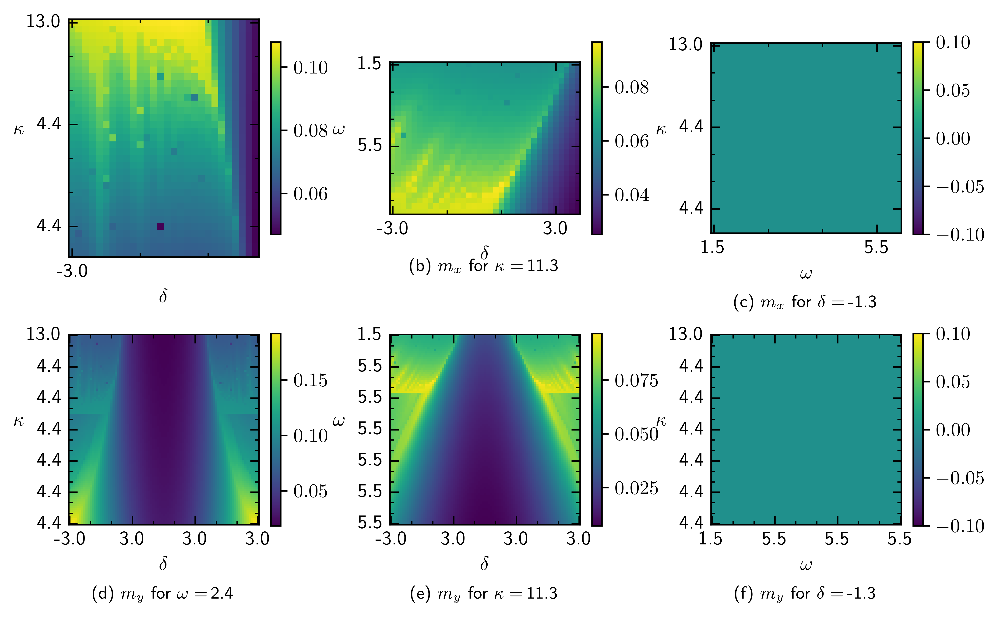

In [19]:

k_cut = 72
w_cut = 20
d_cut = 25



k_cutarray2 = np.load('4.4k13_1.5w5.5_3d/k_cutarray2.npy')
w_cutarray2 = np.load('4.4k13_1.5w5.5_3d/w_cutarray2.npy')
d_cutarray2 = np.load('4.4k13_1.5w5.5_3d/d_cutarray2.npy')
k_cutarray3 = np.load('4.4k13_1.5w5.5_3d/k_cutarray4.npy')
w_cutarray3 = np.load('4.4k13_1.5w5.5_3d/w_cutarray4.npy')
d_cutarray3 = np.load('4.4k13_1.5w5.5_3d/d_cutarray4.npy')

# def count_cycles(m):
#     numberc_w = m.shape[1]
#     difference = dist(m)
#     # print(difference)
#     indices = []
#     for i in range(m.shape[1]):
#         indices.extend(range(i,m.shape[1]-1))
#     indices[-1]=m.shape[1]-1
#     if np.all(m[:,1]==0):
#         return 1, m[:,0]
#     for diff in difference:
#         if diff<1/10**4:
#             numberc_w-=1
#     return max(numberc_w,1), m[:,indices[difference.index(min(difference))]]
def count_cycles(m):
    # print(m.shape)
    s = dist(m,1e-4)
    if len(s)<=1:
        # print(s)
        s = s[0]
        return 1, np.array([s,s,s]).T
    # print(len(s))
    if len(s)==2:
        # print(s)
        return 2, np.sort(np.array([s[0],s[1],s[0]]).T,axis=1)
    s = np.array(s).T
    # print(s.shape[1])
    s = np.sort(s,axis=1)
    return s.shape[1], s[:,:3]
k_cutarray = np.zeros_like(k_cutarray2)
# k_cutarray = np.zeros((k_cutarray2.shape[0],k_cutarray2.shape[0],5,3))
w_cutarray = np.zeros_like(k_cutarray)
d_cutarray = np.zeros_like(k_cutarray)
numberc_k = np.zeros((k_cutarray2.shape[0],k_cutarray2.shape[0]))
numberc_w = np.zeros_like(numberc_k)
numberc_d = np.zeros_like(numberc_k)



for i in range(k_cutarray2.shape[0]):
    for j in range(k_cutarray.shape[0]):
        if stability_plus[k_cut,i,j]==0 and w[i]<=2.73 and d[j]<0:
            numberc_k[i,j], k_cutarray[i,j,:] = count_cycles(k_cutarray3[i,j])
            # k_cutarray[i,j,:] = np.sort(k_cutarray3[i,j])
        else:
            numberc_k[i,j], k_cutarray[i,j,:] = count_cycles(k_cutarray2[i,j])
            # k_cutarray[i,j,:] = np.sort(k_cutarray2[i,j])
            if d[j]>0:
                numberc_k[i,j], k_cutarray[i,j,:]= numberc_k[i,len(d)-1-j], k_cutarray[i,len(d)-1-j,:]
        if stability_plus[i,w_cut,j]==0 and k[i]>9.4 and d[j]<0:
            numberc_w[i,j], w_cutarray[i,j,:] = count_cycles(w_cutarray3[i,j])
            # w_cutarray[i,j,:] = np.sort(w_cutarray3[i,j])
        else:
            numberc_w[i,j], w_cutarray[i,j,:] = count_cycles(w_cutarray2[i,j])
            # w_cutarray[i,j,:] = np.sort(w_cutarray2[i,j])
            if d[j]>0:
                numberc_w[i,j], w_cutarray[i,j,:]= numberc_w[i,len(d)-1-j], w_cutarray[i,len(d)-1-j,:]
        # print(d_cutarray3)
        # numberc_d[i,j], d_cutarray[i,j,:] = count_cycles(d_cutarray3[i,j])
        # d_cutarray[i,j,:] = np.sort(d_cutarray3[i,j])
   
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png')
setup.fig_width= 20.6*cm
setup.fig_height=20.6*cm #29.1*cm
setup.DEFAULT_HEAT_EXTEND =  (-0.5,64.5,39.5,-0.5)#im1.get_extent()#
fig, ax = setup.return_fig(shape=(2,3),dots_per_inch=600)


# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp = TickProperties(SZX=True,SZY=True,\
                       xtick_step_major=30,\
                        xtick_step_minor=10,\
                            ytick_step_major=15,\
                                ytick_step_minor=5)
trash, xw, yw, trash=(-0.5,39.5,29.5,-0.5)#im1.get_extent()#
numb_xticks = xw//tickp.major_xtick_step
numb_yticks = yw//tickp.major_ytick_step
# print(numb_xticks,numb_yticks)

# plots = [m_mod[30,:,:,0],m_mod[30,:,:,1],m_mod[30,:,:,2]]
blocksize =35
cnumb = 0
axis = 2
plots = [[w_cutarray[gridpoints-35:,:28,axis,cnumb],k_cutarray[:28,:35,axis,cnumb],d_cutarray[gridpoints-blocksize:,:blocksize,axis,cnumb]],[w_cutarray[::-1,:,axis,cnumb],k_cutarray[:,:,axis,cnumb],d_cutarray[::-1,:,axis,cnumb]]]
# plots = [[numberc_w[gridpoints-35:,:28],numberc_k[:28,:35],numberc_d[gridpoints-blocksize:,:blocksize]],[numberc_w,numberc_k,numberc_d]]
title = [[r'(a) $m_x$ for $\omega=$\,'+'{:.1f}'.format(w[w_cut]),r'(b) $m_x$ for $\kappa=$\,'+'{:.1f}'.format(k[k_cut]),r'(c) $m_x$ for $\delta=$\,'+'{:.1f}'.format(d[d_cut])],[r'(d) $m_y$ for $\omega=$\,'+'{:.1f}'.format(w[w_cut]),r'(e) $m_y$ for $\kappa=$\,'+'{:.1f}'.format(k[k_cut]),r'(f) $m_y$ for $\delta=$\,'+'{:.1f}'.format(d[d_cut])]]
cbar_label = [r'$m_x$',r'$m_y$']
colormap = 'viridis'
# print(k_cutarray)
for i in range(2):
        im1=ax[i,0].imshow(plots[i][0],cmap=colormap)#,extent=(-0.5,64.5,39.5,-0.5))
        cbar1 = fig.colorbar(im1,ax=ax[i,0],orientation='vertical',shrink=0.33)
        tickformat1 = Format(xscale=d,yscale=k[::-1],xprec="{:.1f}",yprec="{:.1f}",numb_xticks=numb_xticks,numb_yticks=numb_yticks)
        ax[i,0].xaxis.set_major_formatter(ticker.FuncFormatter(tickformat1.formatx0))
        ax[i,0].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
        ax[i,0].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
        ax[i,0].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
        ax[i,0].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
        ax[i,0].yaxis.set_major_formatter(ticker.FuncFormatter(tickformat1.formaty1))
        # cbar1.set_label(label=cbar_label[i],loc='top',rotation=0,labelpad=-5)
        # ax[i,0].text(x=109,y=-3,s=cbar_label[i])
        ax[i,0].set_xlabel(r'$\delta$')
        ax[i,0].set_ylabel(r"$\kappa$",rotation=0)
        ax[i,0].set_title(title[i][0],loc='center',y=-0.45,fontsize=9)
        im2 = ax[i,1].imshow(plots[i][1],cmap=colormap)
        cbar2 = fig.colorbar(im2,ax=ax[i,1],orientation='vertical',shrink=0.33)
        tickformat2 = Format(xscale=d,yscale=w,xprec="{:.1f}",yprec="{:.1f}",numb_xticks=numb_xticks,numb_yticks=numb_yticks)
        ax[i,1].xaxis.set_major_formatter(ticker.FuncFormatter(tickformat2.formatx0))
        ax[i,1].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
        ax[i,1].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
        ax[i,1].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
        ax[i,1].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
        ax[i,1].yaxis.set_major_formatter(ticker.FuncFormatter(tickformat2.formaty1)) 
        # cbar2.set_label(label=cbar_label[i],loc='top',rotation=0,labelpad=-10)
        # ax[i,1].text(x=109,y=-3,s=cbar_label[i])
        ax[i,1].set_ylabel(r'$\omega$',rotation=0,labelpad=10)
        ax[i,1].set_xlabel(r'$\delta$')
        ax[i,1].set_title(title[i][1],loc='center',y=-0.45,fontsize=9)
        im3 = ax[i,2].imshow(plots[i][2],cmap=colormap)
        cbar3 = fig.colorbar(im3,ax=ax[i,2],orientation='vertical',shrink=0.33)
        tickformat3 = Format(xscale=w,yscale=k[::-1],xprec="{:.1f}",yprec="{:.1f}",numb_xticks=numb_xticks,numb_yticks=numb_yticks)
        ax[i,2].xaxis.set_major_formatter(ticker.FuncFormatter(tickformat3.formatx0))
        ax[i,2].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
        ax[i,2].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
        ax[i,2].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
        ax[i,2].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
        ax[i,2].yaxis.set_major_formatter(ticker.FuncFormatter(tickformat3.formaty1)) 
        # cbar3.set_label(label=cbar_label[i],loc='top',rotation=0,labelpad=-13)
        # ax[i,2].text(x=109,y=-3,s=cbar_label[i])
        ax[i,2].set_xlabel(r'$\omega$')
        ax[i,2].set_ylabel(r'$\kappa$',rotation=0)
        ax[i,2].set_title(title[i][2],loc='center',y=-0.45,fontsize=9)
plt.subplots_adjust(hspace=-0.5,wspace=0.35)
plt.show()
# for i in range(k.shape[0]):
#     for j in range(w.shape[0]):
#         if solution_number[14,i,j]==0:
#             print(k[14],w[i],d[j])
# print('')
# for i in range(k.shape[0]):
#     for j in range(w.shape[0]):
#         if solution_number[i,5,j]==2:
#             print(k[i],w[5],d[j])
# print(w[9])
# for i in range(k.shape[0]):
#     for j in range(w.shape[0]):
#         for l in range(d.shape[0]):
#             # if solution_number[i,9,j]==0:
#             if isclose(k[i],5.235294117647059,rel_tol=1e-4,abs_tol=1/10**4) and isclose(w[j],2.3235294117647056,rel_tol=1e-4,abs_tol=1/10**4) and isclose(d[l],4.117647058823529,rel_tol=1e-4,abs_tol=1/10**4):
#                 print(k[i],w[9],d[j],i,j,l)

# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'stable_fixp_extended2.png',bbox_inches='tight')



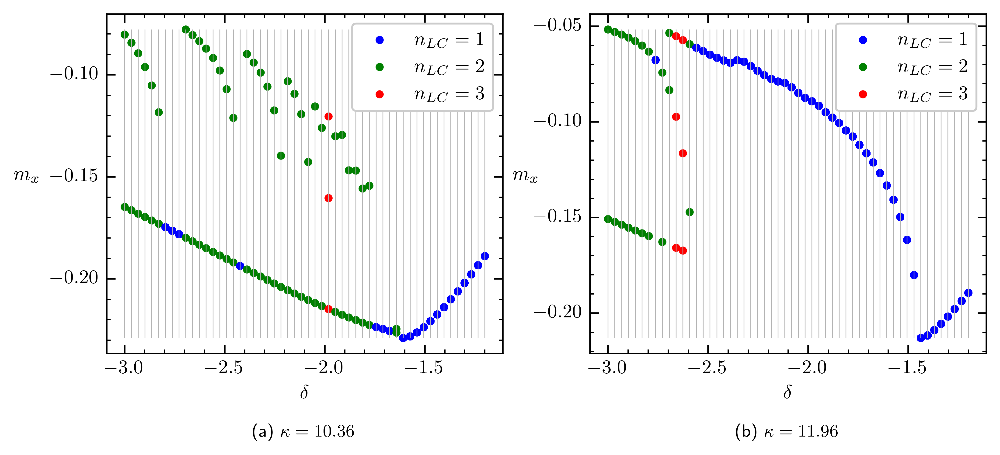

In [49]:
tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.5,\
                        xtick_step_minor=0.1,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
# plot_dim = (-0.5, 54.5, 54.5, -0.5)
setup.fig_width= 20.6*cm
setup.fig_height=8*cm #29.1*cm
# im = plt.imshow(numberc_w)
# heat_extent = plot_dim
# setup.DEFAULT_HEAT_EXTEND =  heat_extent
fig, ax = setup.return_fig(shape=(1,2),dots_per_inch=600)

colors = ['blue','green','red','yellow','black']
krows = [10,36]
titles = [r'(a) ',r'(b) ']
alternative = w_cutarray
for ik,krow in enumerate(krows):
    maxi = np.nanmax(alternative[krow,:,0,:])
    mini = np.nanmin(alternative[krow,:,0,:])
    intersting_j = []
    l = alternative.shape[1]
    label_1 = None
    label_2 = None
    label_3 = None
    lines = [0,0,0]
    for  j in range(l):
        for i in range(27):
            if alternative[krow,j,0,i]!=0:
                if not label_1 or not label_2 or not label_3:
                        index = int(numberc_w[krow,j]-1)
                        lines[index] = ax[ik].scatter(d[j],alternative[krow,j,0,i],s=10,color=colors[int(numberc_w[krow,j]-1)%len(colors)])
                else:
                    ax[ik].scatter(d[j],alternative[krow,j,0,i],s=10,color=colors[int(numberc_w[krow,j]-1)%len(colors)])
        ax[ik].vlines(d[j],mini,maxi,color='0.7',linewidth=0.4)
    if not ik:
        ax[ik].set_ylabel(r'$m_x$',rotation=0,labelpad=12)
    else:
         ax[ik].set_ylabel(r'$m_x$',rotation=0)
    ax[ik].set_xlabel(r'$\delta$')
    ax[ik].legend(lines,[r'$n_{LC}=1$',r'$n_{LC}=2$',r'$n_{LC}=3$'],framealpha=1)
    ax[ik].set_title(titles[ik]+r'$\kappa={:.2f}$'.format(k[krow]),loc='center',y=-0.28,fontsize=9)
plt.subplots_adjust(wspace=0.22)
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'bifurkation.pdf',bbox_inches='tight')
plt.show()
    # if numberc_w[krow,j]==1 and j<30:
    #         print(j, k[krow],d[j])
    #         intersting_j.append(j)
        # ax[1].scatter(d,alternative[krow+1,:,0,i],s=10)
# print(kval,wval, dval)
# plt.show()
# plt.figure()
# plt.scatter(d,numberc_w[krow,:])
# plt.show()
# w_cutarray.shape, d.shape

In [5]:
def prepare_line_plot(filename):
    cutline1k = np.load(filename)
    numberc_line1k = np.zeros((cutline1k.shape[0]))
    cut1k = np.zeros_like(cutline1k)
    for j in range(cutline1k.shape[0]):
        numberc_line1k[j], cut1k[j] = count_cycles(cutline1k[j],cutline1k.shape[-1])
    return numberc_line1k, cut1k

def fill(m,n):
    gap = n-len(m)
    return m+gap*[np.array([np.nan,np.nan,np.nan])]#[m[0]]
def count_cycles(m,numb):
    
    # print(m.shape)
    s = dist(m,5*1e-3)
    # print(s)
    if not s:
        return 0, np.zeros((3,numb))
    if len(s)<=1:
        # print(s)
        s = s[0]
        return 1, np.array(numb*[s]).T
    # print(len(s))
    elif len(s)<numb:
        # print(s)
        return len(s), np.sort(np.array(fill(s,numb)).T,axis=1)
    s = np.array(s).T
    # print(s.shape[1])
    s = np.sort(s,axis=1)
    return s.shape[1], s



In [5]:
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_700line_10k_3s_2.3d2.11.npy')
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_800line_10k_1.7242d1.72403.npy')
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_80line_10k_3s_2.2d1.63.npy')
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_1000line_10k_3s_1.8d1.705.npy')
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/aver_1000line_10k_bay_2.9d2.46.npy')
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_1000line_10k_1.725d1.7235.npy')
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_800line_10k_1.7242d1.72403.npy')
# cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_500line_10k_1.7242d1.724.npy')

cutline1k = np.load('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_500line_10k_1.72415d1.72405.npy')


In [11]:
numberc_line1k = np.zeros((cutline1k.shape[0]))
cut1k = np.zeros_like(cutline1k)
print(cutline1k.shape[0])
for j in range(cutline1k.shape[0]):
    numberc_line1k[j], cut1k[j] = count_cycles(cutline1k[j],cutline1k.shape[-1])
    if numberc_line1k[j]==4:
        print(j)

500


In [48]:
for j in range(cutline1k.shape[0]):
    if numberc_line1k[j]==1:
        print(j,d[j])

458 -1.7241025531914893
468 -1.7241004255319148
479 -1.724098085106383
508 -1.724091914893617
517 -1.72409
523 -1.7240887234042552
524 -1.724088510638298
525 -1.7240882978723404
526 -1.724088085106383
528 -1.724087659574468
529 -1.7240874468085106
530 -1.724087234042553
531 -1.7240870212765957
533 -1.7240865957446807
534 -1.7240863829787234
535 -1.724086170212766
536 -1.7240859574468084
537 -1.724085744680851
538 -1.7240855319148936
539 -1.724085319148936
540 -1.7240851063829787
541 -1.7240848936170212
542 -1.7240846808510637
543 -1.7240844680851064
544 -1.7240842553191489
545 -1.7240840425531914
546 -1.724083829787234
547 -1.7240836170212765
548 -1.724083404255319
549 -1.7240831914893617
550 -1.7240829787234042
551 -1.7240827659574467
552 -1.7240825531914894
553 -1.7240823404255319
554 -1.7240821276595744
555 -1.724081914893617
556 -1.7240817021276595
557 -1.724081489361702
558 -1.7240812765957447
559 -1.7240810638297872
560 -1.7240808510638297
561 -1.7240806382978724
562 -1.724080425

-1.724116132264529


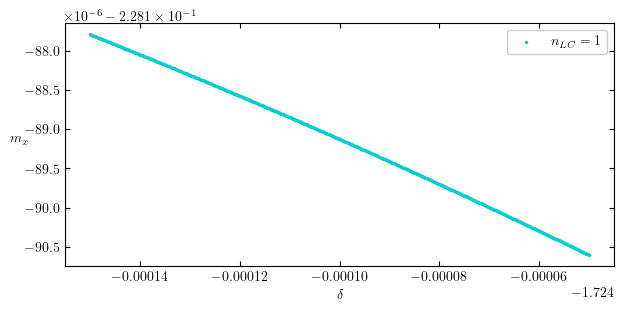

In [13]:
# tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
# tickp = TickProperties(SZX=False,SZY=False,\
                    #    xtick_step_major=0.1,\
                    #     xtick_step_minor=0.05,\
                    #         ytick_step_major=0.05,\
                    #             ytick_step_minor=0.01)
# setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
# plot_dim = (-0.5, 54.5, 54.5, -0.5)
# setup.fig_width= 18*cm
# setup.fig_height=20*cm #29.1*cm
# im = plt.imshow(numberc_w)
# heat_extent = plot_dim
# setup.DEFAULT_HEAT_EXTEND =  heat_extent
# fig, ax = setup.return_fig(shape=(1,2),dots_per_inch=600)
fig, ax = plt.subplots(1,1,figsize=(18*cm,8*cm))
# numberc_line, alternative = prepare_line_plot('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_70line_10k_3s_2.22d1.64.npy')
# d= np.linspace(-2.22,-1.64,numberc_line.shape[0])
# d200= np.linspace(-2.2867924528301886, -1.6,cut200.shape[0])
# d1k =  np.linspace(-1.85, -1.66,cut1k.shape[0])
colors = ['darkturquoise','0.3','indianred','yellow','black']
krows = [10,36]
titles = [r'(a) ',r'(b) ']
# cuts = [cut1k,cut200]
# numbers = [numberc_line1k,numberc_line200]
# for ik,krow in enumerate(krows):
# d = np.linspace(-2.3,-2.11,700)
# d = np.linspace(1.7242,1.72403,800)
# d = np.linspace(-1.725,-1.7235,1000)
d = np.linspace(-1.72415,-1.72405,500)
print(d[169])
# d= np.linspace(-2.2,-1.63,80)
# d = np.linspace(-1.8,-1.705,1000)
# d = np.linspace(-2.9,-2.46,1000)
zoom_i = 0
zoom_j = 1
alternative = cut1k
numberc_line = numberc_line1k
maxi = np.nanmax(alternative[:,0,:])
mini = np.nanmin(alternative[:,0,:])
intersting_j = []
l = alternative.shape[0]
label_1 = None
label_2 = None
label_3 = None
lines = [0,0,0,0]
for  j in range(l):
    for i in range(int(numberc_line[j])):
    # for i in range(cutline.shape[2]):
        if alternative[j,0,i]!=0:
            if not label_1 or not label_2 or not label_3:
                    index = int(numberc_line[j]-1)
                    lines[index] = ax.scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
            else:
                ax.scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
    # ax[ik].vlines(d[j],mini,maxi,color='0.7',linewidth=0.4)

ax.set_ylabel(r'$m_x$',rotation=0)
ax.tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=True)
              
ax.tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=True)    
ax.set_xlabel(r'$\delta$')
ax.legend(lines[:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',r'$n_{LC}=3$'],framealpha=1)

# do = np.array([-1.778,-1.7655,-1.755,-1.7435,-1.735,-1.7245])
# ind= (do+1.8)/(1.8-1.705)*1000
# do = [-2.798, -2.74, -2.694, -2.64, -2.6, -2.55]
# for di in range(len(do)):
#     #  do[di] = d[int(ind[di])]
#      ax.vlines(do[di],mini,maxi,linewidth=0.4,color='0')
# print(do)
# ax.vlines(do[-1],mini,maxi,linewidth=0.4,color='0')

        # d = [d1k,d200][ik]
        
                # ax[ik].set_title(titles[ik]+r'$\kappa={:.2f}$'.format(k[krow]),loc='center',y=-0.28,fontsize=9)
# print(lines)
plt.subplots_adjust(wspace=0.22)
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'bifurkation.pdf',bbox_inches='tight')
plt.show()

In [18]:
numberc_line200 = np.zeros((cutline200.shape[0]))
cut200 = np.zeros_like(cutline200)
for j in range(cutline200.shape[0]):
    numberc_line200[j], cut200[j] = count_cycles(cutline200[j],cutline200.shape[-1])

In [14]:
files = [['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_200line_10k.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_1000line_10k.npy'],['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_1000line_10k_1.73d1.7.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_1000line_10k_1.725d1.7235.npy']]
ds = [[np.linspace(-2.2867924528301886, -1.6,200),np.linspace(-1.85, -1.66,1000)],[np.linspace(-1.73,-1.7,1000),np.linspace(-1.725,-1.7235,1000)]]
numbers = [[],[]]
cuts = [[],[]]
for i in range(len(files)):
    for j in range(2):
        n, c = prepare_line_plot(files[i][j])
        numbers[i].append(n)
        cuts[i].append(c)

In [6]:
files = [['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_400line_10k_2.287d1.6.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_1.85d1.66.npy'],['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_1.76d1.73.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_1000line_10k_1.742d1.727.npy']]
ds = [[np.linspace(-2.287, -1.6,400),np.linspace(-1.85, -1.66,750)],[np.linspace(-1.76,-1.73,750),np.linspace(-1.742,-1.727,1000)]]
numbers = [[],[]]
cuts = [[],[]]
for i in range(len(files)):
    for j in range(2):
        n, c = prepare_line_plot(files[i][j]) 
        numbers[i].append(n)
        cuts[i].append(c)

In [15]:
files = [['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_80line_10k_3s_2.2d1.63.npy'],['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_700line_10k_3s_2.3d2.11.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_1000line_10k_3s_1.8d1.705.npy']]
ds = [[np.linspace(-2.2,-1.63,80)],[np.linspace(-2.3,-2.11,700),np.linspace(-1.8,-1.705,1000)]]
numbers = [[],[]]
cuts = [[],[]]
for i in range(len(files)):
    for j in range(len(files[i])):
        n, c = prepare_line_plot(files[i][j])
        numbers[i].append(n)
        cuts[i].append(c)

In [22]:
files = [['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/aver_1000line_10k_bay_2.9d2.46.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_bay_2.798d2.74.npy'],['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_bay_2.694d2.64.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_bay_2.6d2.55.npy']]
ds = [[np.linspace(-2.9,-2.46,1000),np.linspace(-2.798,-2.74,750)],[np.linspace(-2.694,-2.64,750),np.linspace(-2.6,-2.55,750)]]
numbers = [[],[]]
cuts = [[],[]]
for i in range(len(files)):
    for j in range(len(files[i])):
        n, c = prepare_line_plot(files[i][j])
        numbers[i].append(n)
        cuts[i].append(c)

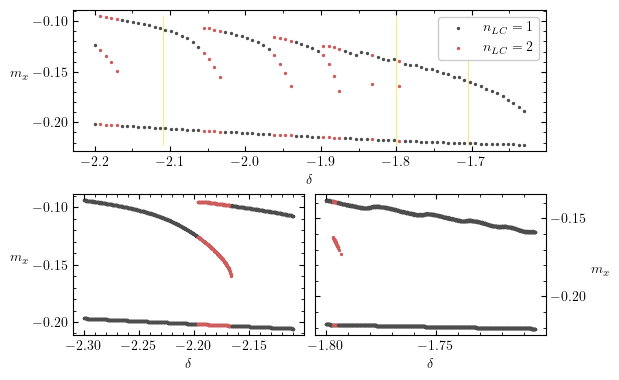

In [ ]:

tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.1,\
                        xtick_step_minor=0.05,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
# plot_dim = (-0.5, 54.5, 54.5, -0.5)
# setup.fig_width= 18*cm
# setup.fig_height=20*cm #29.1*cm
# im = plt.imshow(numberc_w)
# heat_extent = plot_dim
# setup.DEFAULT_HEAT_EXTEND =  heat_extent
# fig, ax = setup.return_fig(shape=(2,2),dots_per_inch=600)
fig = plt.figure(figsize=(32*cm,7*cm))
gs = gridspec.GridSpec(2, 2, figure=fig,wspace=0.05,hspace=0.3,bottom=-0.3,right=0.5)
# numberc_line, alternative = prepare_line_plot('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_70line_10k_3s_2.22d1.64.npy')
# d= np.linspace(-2.22,-1.64,numberc_line.shape[0])
# d200= np.linspace(-2.2867924528301886, -1.6,cut200.shape[0])
# d1k =  np.linspace(-1.85, -1.66,cut1k.shape[0])
colors = ['darkturquoise','0.3','indianred','yellow','black']
krows = [10,36]
titles = [r'(a) ',r'(b) ']
# cuts = [cut1k,cut200]
# numbers = [numberc_line1k,numberc_line200]
# for ik,krow in enumerate(krows):
zoom_i = 0
zoom_j = 1
pad = 10
if True:
    ik = 0
    if True:
        ij= 0
        ax1 = fig.add_subplot(gs[0,:])
        alternative = cuts[ik][ij]
        numberc_line = numbers[ik][ij]
        d=ds[ik][ij]
        
        # d = [d1k,d200][ik]
        maxi = np.nanmax(alternative[:,0,:])
        mini = np.nanmin(alternative[:,0,:])
        intersting_j = []
        l = alternative.shape[0]
        label_1 = None
        label_2 = None
        label_3 = None
        lines = [0,0,0]
        for  j in range(l):
            for i in range(int(numberc_line[j])):
            # for i in range(cutline.shape[2]):
                if alternative[j,0,i]!=0:
                    if not label_1 or not label_2 or not label_3:
                            index = int(numberc_line[j]-1)
                            lines[index] = ax1.scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
                    else:
                        ax1.scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
            # ax[ik].vlines(d[j],mini,maxi,color='0.7',linewidth=0.4)
        if ij:
            ax1.yaxis.set_label_position('right')
            ax1.set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        else:
            ax1.set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        ax1.tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=True)
        if ij==1:               
            ax1.tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=False,labelright=True) 
        else:               
            ax1.tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=True)    
        ax1.set_xlabel(r'$\delta$')
        ax1.legend(lines[1:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',r'$n_{LC}=3$'],framealpha=1)
        # ax[ij].legend(lines[1:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',r'$n_{LC}=3$'],framealpha=1)
        ax1.yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
        ax1.yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
        ax1.xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
        ax1.xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))

        sep_col = 'goldenrod'
        # ax1.vlines(ds[1][0][0],mini,maxi,linewidth=0.4,color='0')
        ax1.vlines(ds[1][0][-1],mini,maxi,linewidth=0.4,color=sep_col)
        ax1.vlines(ds[1][1][0],mini,maxi,linewidth=0.4,color=sep_col)
        ax1.vlines(ds[1][1][-1],mini,maxi,linewidth=0.4,color=sep_col)
        

    ik=1
    ax = [0,0]
    for ij in range(2):
        
        ax[ij] = fig.add_subplot(gs[1,ij])
        alternative = cuts[ik][ij]
        numberc_line = numbers[ik][ij]
        d=ds[ik][ij]
        
        # d = [d1k,d200][ik]
        maxi = np.nanmax(alternative[:,0,:])
        mini = np.nanmin(alternative[:,0,:])
        intersting_j = []
        l = alternative.shape[0]
        label_1 = None
        label_2 = None
        label_3 = None
        lines = [0,0,0]
        for  j in range(l):
            for i in range(int(numberc_line[j])):
            # for i in range(cutline.shape[2]):
                if alternative[j,0,i]!=0:
                    if not label_1 or not label_2 or not label_3:
                            index = int(numberc_line[j]-1)
                            lines[index] = ax[ij].scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
                    else:
                        ax[ij].scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
            # ax[ik].vlines(d[j],mini,maxi,color='0.7',linewidth=0.4)
        if ij:
            ax[ij].yaxis.set_label_position('right')
            ax[ij].set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        else:
            ax[ij].set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        ax[ij].tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=True)
        if ij==1:               
            ax[ij].tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=False,labelright=True) 
        else:               
            ax[ij].tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=True)    
        ax[ij].set_xlabel(r'$\delta$')
        tickp2 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.05,\
                        xtick_step_minor=0.01,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
        ax[ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp2.major_ytick_step))
        ax[ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp2.minor_ytick_step))
        ax[ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp2.major_xtick_step))
        ax[ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp2.minor_xtick_step))

        # ax[ij].legend(lines[1:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',r'$n_{LC}=3$'],framealpha=1)
        # if not (ij==1 and ik==1):
            
        #     ax1.vlines(ds[zoom_i][zoom_j][0],mini,maxi,linewidth=0.4,color='0')
        #     ax1.vlines(ds[zoom_i][zoom_j][-1],mini,maxi,linewidth=0.4,color='0')
        # else:
        #     do = [-1.7242,-1.72403]
        #     ax1.vlines(do[0],mini,maxi,linewidth=0.4,color='0')
        #     ax1.vlines(do[-1],mini,maxi,linewidth=0.4,color='0')
        # zoom_i = 1
        # zoom_j = (zoom_j+1)%2
                # ax[ik].set_title(titles[ik]+r'$\kappa={:.2f}$'.format(k[krow]),loc='center',y=-0.28,fontsize=9)
# print(lines)
# plt.subplots_adjust(wspace=0.22)
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'multistab_line_3s.pdf',bbox_inches='tight')
plt.show()

In [31]:
files = [['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/aver_1000line_10k_bay_2.9d2.46.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_bay_2.798d2.74.npy'],['/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_bay_2.694d2.64.npy','/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_750line_10k_bay_2.6d2.55.npy']]
ds = [[np.linspace(-2.9,-2.46,1000),np.linspace(-2.798,-2.74,750)],[np.linspace(-2.694,-2.64,750),np.linspace(-2.6,-2.55,750)]]
numbers = [[],[]]
cuts = [[],[]]
for i in range(len(files)):
    for j in range(len(files[i])):
        n, c = prepare_line_plot(files[i][j])
        numbers[i].append(n)
        cuts[i].append(c)
        if np.any(n>3):
            print(max(n),ds[i][j])

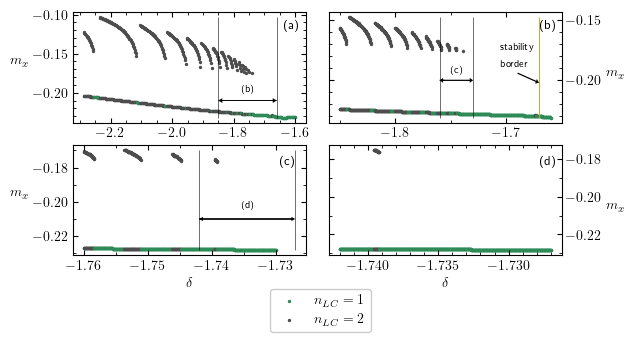

In [ ]:
# tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp1 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.2,\
                        xtick_step_minor=0.05,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
tickp2 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.1,\
                        xtick_step_minor=0.05,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
tickp3 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.01,\
                        xtick_step_minor=0.005,\
                            ytick_step_major=0.02,\
                                ytick_step_minor=0.01)
tickp4 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.005,\
                        xtick_step_minor=0.001,\
                            ytick_step_major=0.02,\
                                ytick_step_minor=0.01)
# setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp1,formater=tickformat)
# plot_dim = (-0.5, 54.5, 54.5, -0.5)
# setup.fig_width= 32*cm
# setup.fig_height=7*cm #29.1*cm
# im = plt.imshow(numberc_w)
# heat_extent = plot_dim
# setup.DEFAULT_HEAT_EXTEND =  heat_extent
# fig, ax = setup.return_fig(shape=(1,2),dots_per_inch=600)
fig, ax = plt.subplots(2,2,figsize=(16*cm,8*cm))
# numberc_line, alternative = prepare_line_plot('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_70line_10k_3s_2.22d1.64.npy')
# d= np.linspace(-2.22,-1.64,numberc_line.shape[0])
# d200= np.linspace(-2.2867924528301886, -1.6,cut200.shape[0])
# d1k =  np.linspace(-1.85, -1.66,cut1k.shape[0])
colors = ['seagreen','0.3','indianred','yellow','black']
krows = [10,36]
titles = [r'(a) ',r'(b) ']
# cuts = [cut1k,cut200]
# numbers = [numberc_line1k,numberc_line200]
# for ik,krow in enumerate(krows):
zoom_i = 0
zoom_j = 1
label_1 = None
label_2 = None
label_3 = None
lines = [0,0,0]
title = [['(a)','(b)'],['(c)','(d)']]
for ik in range(ax.shape[0]):
    for ij in range(2):
        alternative = cuts[ik][ij]#[::15]
        numberc_line = numbers[ik][ij]#[::15]
        d=ds[ik][ij]#[::15]
        
        # d = [d1k,d200][ik]
        maxi = np.nanmax(alternative[:,0,:])
        mini = np.nanmin(alternative[:,0,:])
        intersting_j = []
        l = alternative.shape[0]
        # label_1 = None
        # label_2 = None
        # label_3 = None
        # lines = [0,0,0]
        for  j in range(l):
            for i in range(int(numberc_line[j])):
            # for i in range(cutline.shape[2]):
                if alternative[j,0,i]!=0:
                    if not label_1 or not label_2 or not label_3:
                            index = int(numberc_line[j]-1)
                            lines[index] = ax[ik,ij].scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
                    else:
                        ax[ik,ij].scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
            # ax[ik].vlines(d[j],mini,maxi,color='0.7',linewidth=0.4)
        pad = 10
        if ij:
            ax[ik,ij].yaxis.set_label_position('right')
            ax[ik,ij].set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        else:
            ax[ik,ij].set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        ax[ik,ij].tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=True)
        if ij==1:               
            ax[ik,ij].tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=False,labelright=True) 
        else:               
            ax[ik,ij].tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=True)    
        ax[ik,ij].set_xlabel(r'$\delta$')
        
        
        if (ik==0):
            # ax[ik,ij].legend(lines[:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',
            # r'$n_{LC}=3$'],framealpha=1,loc=(1,0.2))
            
            do = [-2.798, -2.74, -2.694, -2.64, -2.6, -2.55]
            do = [-1.792,-1.787,-1.76,-1.73]
            # do = [-1.76,-1.73]
            # lev = [-0.147,-0.147,-0.075]
            lev = [-0.2,-0.2]
            tex = ['(d)','(c)']
            
            if ij ==1:
                ax[ik,ij].vlines(-1.6707014028056113,mini,maxi,linewidth=0.7,color='goldenrod')
                ax[ik,ij].text(x=-1.706,y=-0.175,s=r'\,\\stability\\border',color='0',fontsize=7)
                ax[ik,ij].arrow(-1.69,-0.194,-1.6707014028056113+1.69,-0.008,head_width=0.004,head_length=0.003,facecolor='0',length_includes_head=True,linewidth=0.02)
                # d_stab = np.linspace(-1.74, -1.6,x_stab.shape[0])
                # ax[ik,ij].scatter(d_stab,x_stab,color='goldenrod')
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp2.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp2.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp2.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp2.minor_xtick_step))
                for di in range(2,len(do)):
                    #  do[di] = d[int(ind[di])]
                    ax[ik,ij].vlines(do[di],mini,maxi,linewidth=0.4,color='0')
                    if di>=2:
                        ax[ik,ij].arrow(do[di-(di%2)]+0.004*(di%2),lev[di//2],(do[int(di+(-1)**di*1)]-do[di])*(1-di%2)-0.004*(di%2),0,head_width=0.004,head_length=0.003,facecolor='0',length_includes_head=True,linewidth=0.02)
                        if di%2:
                            ax[ik,ij].text(x=(do[di]+do[int(di+(-1)**di*1)])/2,y=lev[di//2]+0.006*(1-2.5*(di//5)),s=tex[di//2],horizontalalignment='center',fontsize=7)
                    else:
                        ax[ik,ij].arrow(-(1-2*(di%2))*0.01+do[di],lev[di//2],(1-2*(di%2))*0.01,0,head_width=0.004,head_length=0.003,facecolor='0',length_includes_head=True,linewidth=0.02)
                        if di%2:
                            ax[ik,ij].text(x=(1-2*(di%2))*0.015+do[di],y=lev[di//2]+0.006*(1-2.5*(di//5)),s=tex[di//2],horizontalalignment='center',fontsize=7)
                ax[ik,ij].text(d[-1]-0.01,maxi-0.009,s=title[ik][ij],fontsize=9)
            else:
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp1.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp1.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp1.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp1.minor_xtick_step))
                do = [-1.85, -1.66]
                lev = [-0.21]
                for di in range(len(do)):
                    #  do[di] = d[int(ind[di])]
                    # ax[ik,ij].vlines(do[di],mini,maxi,linewidth=0.4,color='0')
                    ax[ik,ij].vlines(do[di],mini,maxi,linewidth=0.4,color='0')
                    ax[ik,ij].arrow(do[di],lev[di//2],do[int(di+(-1)**di*1)]-do[di],0,head_width=0.006,head_length=0.013,facecolor='0',length_includes_head=True,linewidth=0.02)
                    if di%2:
                            ax[ik,ij].text(x=(do[di]+do[int(di+(-1)**di*1)])/2,y=lev[di//2]+0.01*(1-2.5*(di//5)),s='(b)',horizontalalignment='center',fontsize=7)
                ax[ik,ij].text(d[-1]-0.036,maxi-0.015,s=title[ik][ij],fontsize=9)
        else:
            if ij==0:
                do = [-1.742,-1.727]
                lev = [-0.21]
                for di in range(len(do)):
                    ax[ik,ij].vlines(do[di],mini,maxi,linewidth=0.4,color='0')
                    ax[ik,ij].arrow(do[di-(di%2)]+0.0006*(di%2),lev[di//2],(do[int(di+(-1)**di*1)]-do[di])*(1-di%2)-0.0006*(di%2),0,head_width=0.0025,head_length=0.0006,facecolor='0',length_includes_head=True,linewidth=0.005)
                    if di%2:
                        ax[ik,ij].text(x=(do[di]+do[int(di+(-1)**di*1)])/2,y=lev[di//2]+0.006*(1-2.5*(di//5)),s=tex[di//2],horizontalalignment='center',fontsize=7)
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp3.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp3.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp3.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp3.minor_xtick_step))
            
                ax[ik,ij].text(d[-1]+0.0007,maxi-0.009,s=title[ik][ij],fontsize=9)
            else:
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp4.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp4.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp4.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp4.minor_xtick_step))
            
                ax[ik,ij].text(d[-1]-0.0008,maxi-0.008,s=title[ik][ij],fontsize=9)
        #     do = [-1.7242,-1.72403]
            # ax[ik,ij].vlines(do[0],mini,maxi,linewidth=0.4,color='0')
        #     ax[ik,ij].vlines(do[-1],mini,maxi,linewidth=0.4,color='0')
        # zoom_i = 1
        # zoom_j = (zoom_j+1)%2
                # ax[ik].set_title(titles[ik]+r'$\kappa={:.2f}$'.format(k[krow]),loc='center',y=-0.28,fontsize=9)
        
ax[1,1].legend(lines[:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',
            r'$n_{LC}=3$'],loc=(-0.254,-0.7),framealpha=1)
# print(lines)
plt.subplots_adjust(wspace=0.1)
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'multistab_line.pdf',bbox_inches='tight')
plt.show()

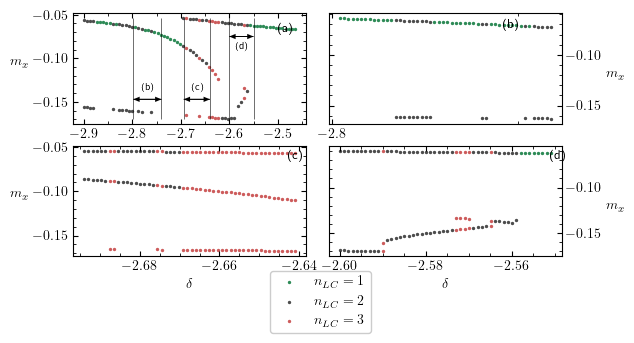

In [34]:
# tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp1 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.1,\
                        xtick_step_minor=0.05,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
tickp2 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.1,\
                        xtick_step_minor=0.05,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
tickp3 = TickProperties(SZX=False,SZY=False,\
                       xtick_step_major=0.02,\
                        xtick_step_minor=0.005,\
                            ytick_step_major=0.05,\
                                ytick_step_minor=0.01)
tickp4 =tickp3#= TickProperties(SZX=False,SZY=False,\
                    #    xtick_step_major=0.002,\
                    #     xtick_step_minor=0.0005,\
                    #         ytick_step_major=0.02,\
                    #             ytick_step_minor=0.01)
# setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp1,formater=tickformat)
# plot_dim = (-0.5, 54.5, 54.5, -0.5)
# setup.fig_width= 32*cm
# setup.fig_height=7*cm #29.1*cm
# im = plt.imshow(numberc_w)
# heat_extent = plot_dim
# setup.DEFAULT_HEAT_EXTEND =  heat_extent
# fig, ax = setup.return_fig(shape=(1,2),dots_per_inch=600)
fig, ax = plt.subplots(2,2,figsize=(16*cm,8*cm))
# numberc_line, alternative = prepare_line_plot('/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/means_70line_10k_3s_2.22d1.64.npy')
# d= np.linspace(-2.22,-1.64,numberc_line.shape[0])
# d200= np.linspace(-2.2867924528301886, -1.6,cut200.shape[0])
# d1k =  np.linspace(-1.85, -1.66,cut1k.shape[0])
colors = ['seagreen','0.3','indianred','yellow','black']
krows = [10,36]
titles = [r'(a) ',r'(b) ']
# cuts = [cut1k,cut200]
# numbers = [numberc_line1k,numberc_line200]
# for ik,krow in enumerate(krows):
zoom_i = 0
zoom_j = 1
label_1 = None
label_2 = None
label_3 = None
lines = [0,0,0]
title = [['(a)','(b)'],['(c)','(d)']]
for ik in range(ax.shape[0]):
    for ij in range(2):
        alternative = cuts[ik][ij][::15]
        numberc_line = numbers[ik][ij][::15]
        d=ds[ik][ij][::15]
        
        # d = [d1k,d200][ik]
        maxi = np.nanmax(alternative[:,0,:])
        mini = np.nanmin(alternative[:,0,:])
        intersting_j = []
        l = alternative.shape[0]
        # label_1 = None
        # label_2 = None
        # label_3 = None
        # lines = [0,0,0]
        for  j in range(l):
            for i in range(int(numberc_line[j])):
            # for i in range(cutline.shape[2]):
                if alternative[j,0,i]!=0:
                    if not label_1 or not label_2 or not label_3:
                            index = int(numberc_line[j]-1)
                            lines[index] = ax[ik,ij].scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
                    else:
                        ax[ik,ij].scatter(d[j],alternative[j,0,i],s=2,color=colors[int(numberc_line[j]-1)%len(colors)])
            # ax[ik].vlines(d[j],mini,maxi,color='0.7',linewidth=0.4)
        pad = 10
        if ij:
            ax[ik,ij].yaxis.set_label_position('right')
            ax[ik,ij].set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        else:
            ax[ik,ij].set_ylabel(r'$m_x$',rotation=0,labelpad=pad)
        ax[ik,ij].tick_params(axis='x',direction='in',which='both',bottom=True,top=True,labelbottom=True)
        if ij==1:               
            ax[ik,ij].tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=False,labelright=True) 
        else:               
            ax[ik,ij].tick_params(axis='y',direction='in',which='both',left=True,right=True,labelleft=True)    
        ax[ik,ij].set_xlabel(r'$\delta$')
        
        
        if (ik==0):
            # ax[ik,ij].legend(lines[:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',
            # r'$n_{LC}=3$'],framealpha=1,loc=(1,0.2))
            
            do = [-2.798, -2.74, -2.694, -2.64, -2.6, -2.55]
            # do = [-1.792,-1.787,-1.76,-1.73]
            # do = [-1.76,-1.73]
            lev = [-0.147,-0.147,-0.075]
            # lev = [-0.2,-0.2]
            # tex = ['(d)','(c)']
            tex = ['(b)','(c)','(d)']
            if ij ==1:
                # ax[ik,ij].vlines(-1.6707014028056113,mini,maxi,linewidth=0.7,color='goldenrod')
                # ax[ik,ij].text(x=-1.706,y=-0.175,s=r'\,\\stability\\border',color='0',fontsize=7)
                # ax[ik,ij].arrow(-1.69,-0.194,-1.6707014028056113+1.69,-0.008,head_width=0.004,head_length=0.003,facecolor='0',length_includes_head=True,linewidth=0.02)
                # d_stab = np.linspace(-1.74, -1.6,x_stab.shape[0])
                # ax[ik,ij].scatter(d_stab,x_stab,color='goldenrod')
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp2.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp2.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp2.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp2.minor_xtick_step))
                # for di in range(len(do)):
                #     #  do[di] = d[int(ind[di])]
                #     ax[ik,ij].vlines(do[di],mini,maxi,linewidth=0.4,color='0')
                #     if di>=2:
                #         ax[ik,ij].arrow(do[di-(di%2)]+0.004*(di%2),lev[di//2],(do[int(di+(-1)**di*1)]-do[di])*(1-di%2)-0.004*(di%2),0,head_width=0.004,head_length=0.003,facecolor='0',length_includes_head=True,linewidth=0.02)
                #         if di%2:
                #             ax[ik,ij].text(x=(do[di]+do[int(di+(-1)**di*1)])/2,y=lev[di//2]+0.006*(1-2.5*(di//5)),s=tex[di//2],horizontalalignment='center',fontsize=7)
                #     else:
                #         ax[ik,ij].arrow(-(1-2*(di%2))*0.01+do[di],lev[di//2],(1-2*(di%2))*0.01,0,head_width=0.004,head_length=0.003,facecolor='0',length_includes_head=True,linewidth=0.02)
                #         if di%2:
                #             ax[ik,ij].text(x=(1-2*(di%2))*0.015+do[di],y=lev[di//2]+0.006*(1-2.5*(di//5)),s=tex[di//2],horizontalalignment='center',fontsize=7)
                ax[ik,ij].text(d[-1]-0.013,maxi-0.009,s=title[ik][ij],fontsize=9)
            else:
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp1.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp1.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp1.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp1.minor_xtick_step))
                # do = [-1.85, -1.66]
                # lev = [-0.21]
                for di in range(len(do)):
                    #  do[di] = d[int(ind[di])]
                    # ax[ik,ij].vlines(do[di],mini,maxi,linewidth=0.4,color='0')
                    ax[ik,ij].vlines(do[di],mini,maxi,linewidth=0.4,color='0')
                    ax[ik,ij].arrow(do[di],lev[di//2],do[int(di+(-1)**di*1)]-do[di],0,head_width=0.006,head_length=0.013,facecolor='0',length_includes_head=True,linewidth=0.02)
                    if di%2:
                            ax[ik,ij].text(x=(do[di]+do[int(di+(-1)**di*1)])/2,y=lev[di//2]+0.01*(1-2.5*(di//5)),s=tex[di//2],horizontalalignment='center',fontsize=7)
                ax[ik,ij].text(d[-1]-0.036,maxi-0.015,s=title[ik][ij],fontsize=9)
        else:
            if ij==0:
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp3.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp3.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp3.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp3.minor_xtick_step))
            
                ax[ik,ij].text(d[-1]-0.0017,maxi-0.009,s=title[ik][ij],fontsize=9)
            else:
                ax[ik,ij].yaxis.set_major_locator(ticker.MultipleLocator(tickp4.major_ytick_step))
                ax[ik,ij].yaxis.set_minor_locator(ticker.MultipleLocator(tickp4.minor_ytick_step))
                ax[ik,ij].xaxis.set_major_locator(ticker.MultipleLocator(tickp4.major_xtick_step))
                ax[ik,ij].xaxis.set_minor_locator(ticker.MultipleLocator(tickp4.minor_xtick_step))
            
                ax[ik,ij].text(d[-1]-0.0003,maxi-0.009,s=title[ik][ij],fontsize=9)
        #     do = [-1.7242,-1.72403]
            # ax[ik,ij].vlines(do[0],mini,maxi,linewidth=0.4,color='0')
        #     ax[ik,ij].vlines(do[-1],mini,maxi,linewidth=0.4,color='0')
        # zoom_i = 1
        # zoom_j = (zoom_j+1)%2
                # ax[ik].set_title(titles[ik]+r'$\kappa={:.2f}$'.format(k[krow]),loc='center',y=-0.28,fontsize=9)
        
ax[1,1].legend(lines[:int(np.max(numberc_line))],[r'$n_{LC}=1$',r'$n_{LC}=2$',
            r'$n_{LC}=3$'],loc=(-0.254,-0.7),framealpha=1)
# print(lines)
plt.subplots_adjust(wspace=0.1)
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'multistab_line.pdf',bbox_inches='tight')
plt.show()

In [27]:
x_stab = np.load('4.4k13_1.5w5.5_3d/stab_xsol_dline.npy')
np.load('4.4k13_1.5w5.5_3d/stab_xsol_dline_bay.npy')

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, na

In [51]:
-2.287, -1.6, -2.9,-2.46
def plot_index(val,arr,scale):
    return scale*(val-arr[0])/(arr[-1]-arr[0])


11.02876404494382 -2.939325842696629 -2.676404494382022


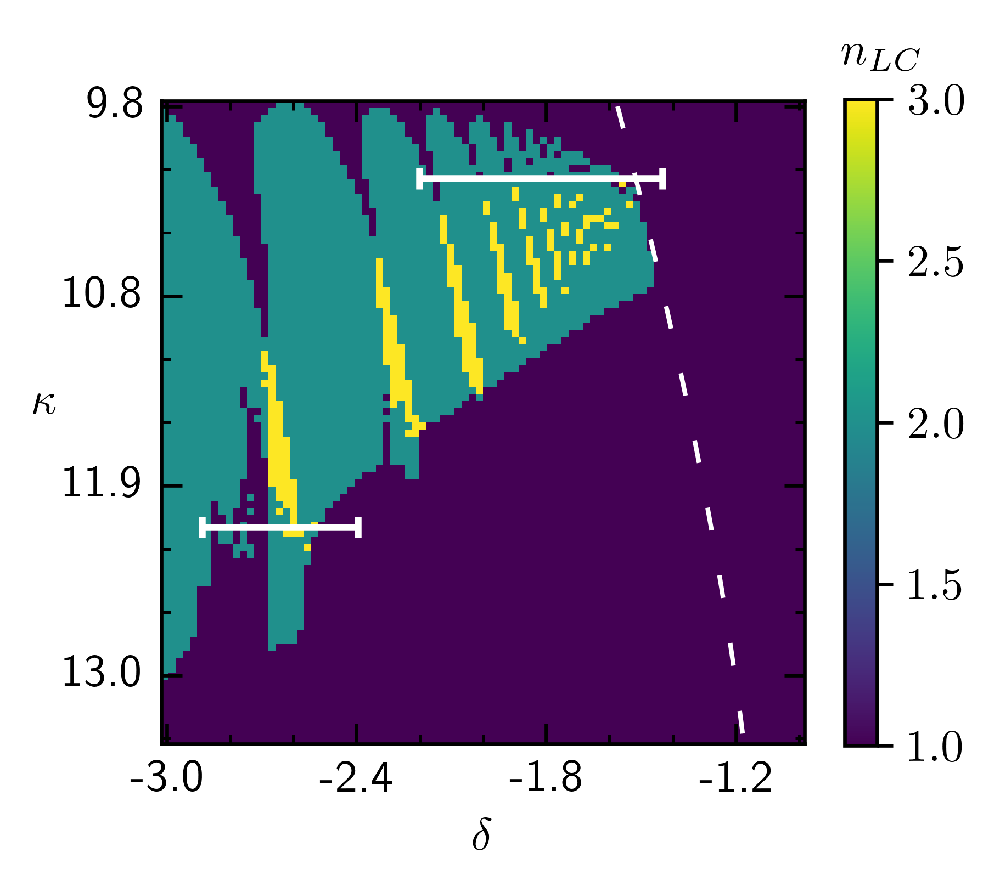

In [ ]:
gridpoints = w_cutarray2.shape[0]

k = np.linspace(9.751111111111111, 13.0,gridpoints)
d = np.linspace(-3.0, -1.2,gridpoints)
tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp = TickProperties(SZX=True,SZY=True,\
                       xtick_step_major=18,\
                        xtick_step_minor=6,\
                            ytick_step_major=18,\
                                ytick_step_minor=6)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
plot_dim = (-0.5, 60.5, 60.5, -0.5)
setup.fig_width= 8*cm
setup.fig_height=8*cm #29.1*cm
heat_extent = plot_dim
setup.DEFAULT_HEAT_EXTEND =  heat_extent
shrink_cbar = 0.81
x_pos = 64
y_pos = -4

fig, ax = setup.return_fig(shape=(1,1),dots_per_inch=600)
im2 = ax.imshow(numberc_w,extent=plot_dim)
# ax.tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=False)
cbar2 = fig.colorbar(im2,ax=ax,orientation='vertical',shrink=shrink_cbar)
ax.set_xlabel(r'$\delta$')
ax.set_ylabel(r'$\kappa$',rotation=0)
ax.text(x_pos,y_pos,r'$n_{LC}$')
end = 1
ax.hlines(plot_index(10.118909853249477,k,60.5),plot_index(-2.287,d,60.5),plot_index(-1.6,d,60.5),color='1')
ax.hlines(plot_index(11.896603773584905,k,60.5),plot_index(-2.9,d,60.5),plot_index(-2.46,d,60.5),color='1')
ax.vlines(plot_index(-2.46,d,60.5),plot_index(11.896603773584905,k,60.5)+end,plot_index(11.896603773584905,k,60.5)-end,color='1')
ax.vlines(plot_index(-2.9,d,60.5),plot_index(11.896603773584905,k,60.5)+end,plot_index(11.896603773584905,k,60.5)-end,color='1')
ax.vlines(plot_index(-1.6,d,60.5),plot_index(10.118909853249477,k,60.5)+end,plot_index(10.118909853249477,k,60.5)-end,color='1')
ax.vlines(plot_index(-2.287,d,60.5),plot_index(10.118909853249477,k,60.5)+end,plot_index(10.118909853249477,k,60.5)-end,color='1')
print(k[35],d[3],d[16])
ax.plot(spline(xg,*g_sp_param[0]),xg,color='1',linestyle=(0, (5, 10)),linewidth=1)
            
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'multistab_cuts.png',bbox_inches='tight')
plt.show()


In [18]:
root_path = '/home/christian/Documents/Bachelor/numerics/mean_field/4.4k13_1.5w5.5_3d/'
gridpoints = 54
w_cutarray3 = np.zeros((gridpoints,gridpoints,3,15))
period_found3 = np.zeros((gridpoints,gridpoints,15))
subgrid = gridpoints//3
for i in range(3):
    for j in range(3):
        w_cutarray3[i*subgrid:(i+1)*subgrid,j*subgrid:(j+1)*subgrid,:,:] = np.load(root_path+f'w_cut_aver_p_{i}_{j}.npy')
        period_found3[i*subgrid:(i+1)*subgrid,j*subgrid:(j+1)*subgrid,:] = np.load(root_path+f'w_cut_peval_{i}_{j}.npy')

In [19]:
w_cutarray2 = np.zeros_like(w_cutarray3)
period_found2 = np.zeros_like(period_found3)
for i in range(3):
    for j in range(3):
        for n in range(subgrid):
            ink, ind = subgrid*i+j*subgrid//3+ n//3, subgrid%3+ n%3
            w_cutarray2[ink,ind*subgrid:ind*subgrid+subgrid] = w_cutarray3[i*subgrid+n,j*subgrid:subgrid*(j+1)]
            period_found2[ink,ind*subgrid:ind*subgrid+subgrid] = period_found3[i*subgrid+n,j*subgrid:subgrid*(j+1)]

In [153]:
np.save(root_path+'w_cut_aver_corrected',w_cutarray2)
# np.save(root_path+'period_found_sorted',period_found2)

In [152]:
w_aver_old = np.load(root_path+'w_cut_aver_sorted.npy')
for i in range(gridpoints):
    for j in range(gridpoints):
        if np.all(w_cutarray2[i,j]==0):
            w_cutarray2[i,j,:,:15]=w_aver_old[i,j]

In [33]:
def find_index(dv):
  
    dind =0
    d = np.linspace(-3.0, -1.2,w_cutarray2.shape[0])
  
    for id, dval in enumerate(d):
        if dval>=dv:
            dind = id
            break
    return dind
id1  =find_index(-2.3)
id2 = find_index(-2.11)

NameError: name 'w_cutarray2' is not defined

In [34]:
gridpoints = 90
halfgrid = gridpoints#//2+gridpoints%2
# gamma = np.linspace(0.1,6,gridpoints)
gamma_cut = 0.2#gamma[85]
# k= np.linspace(4.4,13,gridpoints)

k = np.linspace(9.751111111111111, 13.0,gridpoints)
d = np.linspace(-3.0, -1.2,gridpoints)
omega_cut = 2.3889
Gam =1

TypeError: 'AxesSubplot' object is not subscriptable

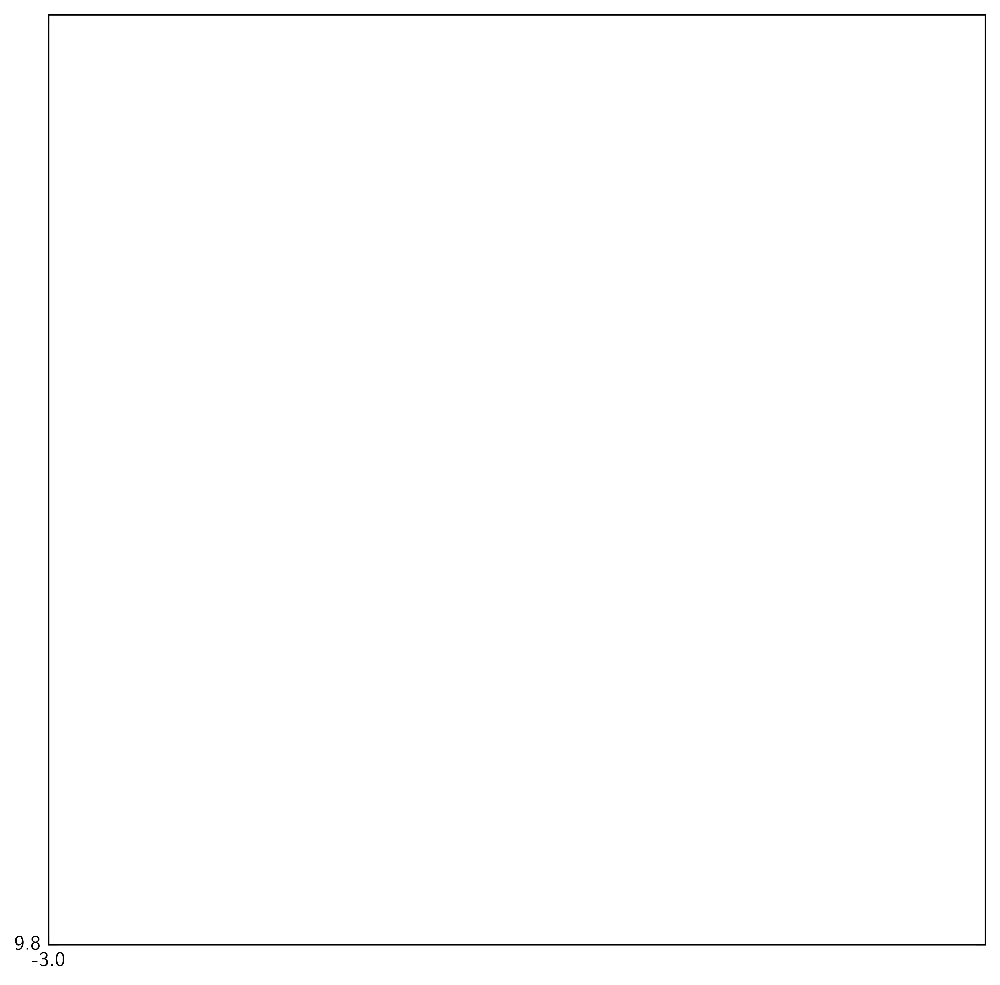

In [35]:
from add_solutions_functions import *
from multiprocessing import Pool
xsol_gcut = np.zeros(2*[gridpoints]+[5])
ysol_gcut = np.zeros_like(xsol_gcut)
solution_number_gcut = np.zeros(2*[gridpoints])

xsol_wcut = np.zeros(2*[gridpoints]+[5])
ysol_wcut = np.zeros_like(xsol_wcut)
solution_number_wcut = np.zeros(2*[gridpoints])


mgridpoints = 40
mgrid = np.zeros((mgridpoints,mgridpoints,2))
rho = np.linspace(0,0.5,mgridpoints)
phi = np.linspace(0,2*np.pi,mgridpoints)
for i, disti in enumerate(rho):
    for j, ang in enumerate(phi):
        mgrid[i,j,:]= disti*np.cos(ang), disti*np.sin(ang)

def root2d(k,w,d,sgam):
    solnumb =0
    rejections=0
    xsol_list =[]
    ysol_list = []
    rejected = []
    for i in range(mgrid.shape[0]):
        for j in range(mgrid.shape[1]):
            r = root(Foriginal_vec,args=(w,k,d,Gam,sgam),x0=mgrid[i,j])
            xsol_list, ysol_list, solnumb, rejections, rejected = add_sol2d(k,w,d,sgam,r,xsol_list,ysol_list,solnumb,rejections,rejected)
    return solnumb, xsol_list, ysol_list#, rejections

# check_sol = np.zeros_like(solution_number)
# for ik, kval in enumerate(k):
#     for iw, wval in enumerate(w):
#         for id, dval in enumerate(d):
#             for i in range(-2,3):
#                 if solution_number[ik,iw,(id+i)%gridpoints]:
#                     check_sol[ik,iw,id]=1
#                 elif solution_number[ik,(iw+i)%gridpoints,id]:
#                     check_sol[ik,iw,id]=1
#                 elif solution_number[(ik+i)%gridpoints,iw,id]:
#                     check_sol[ik,iw,id]=1
# halfgrid = gridpoints//2+gridpoints%2
def wrapper(index):
    # ik, ig, id = index//gridpoints**2,(index%gridpoints**2)//gridpoints, index%gridpoints
    io, id = index//halfgrid, index%halfgrid
    # ik, ig, id = index//(gridpoints*halfgrid),(index%(gridpoints*halfgrid))//halfgrid, index%halfgrid
    # kval, sgam, dval = k[ik], gamma[ig], d[id]
    # if check_sol[ik,iw,id] and dval!=0:
    return root2d(k[io],omega_cut,d[id],gamma_cut)
    # return root2d(kappa_cut1,omega_cut,d[id],gamma[io]), root2d(kappa_cut2,w[io],d[id],gamma_cut)
    # else:
    #     return [0]
    

po = Pool(9)
result = po.imap(wrapper,range(gridpoints*halfgrid))
# result = po.imap(wrapper,range(gridpoints**3))

reject = np.zeros_like(solution_number_gcut)
for index, res in enumerate(result):
    # ik, ig, id = index//gridpoints**2,(index%gridpoints**2)//gridpoints, index%gridpoints
    # ik, ig, id = index//(gridpoints*halfgrid),(index%(gridpoints*halfgrid))//halfgrid, index%halfgrid
    # if check_sol[ik,iw,id] and d[id]!=0:
    io, id = index//halfgrid, index%halfgrid
    [solig, xsol_gcut[io,id,:solig], ysol_gcut[io,id,:solig]] = res
    
    solution_number_gcut[io,id] = solig
    # solution_number_gcut[io,-1-id], xsol_gcut[io,-1-id,:solig], ysol_gcut[io,-1-id,:solig] = solig,xsol_gcut[io,id,:solig], ysol_gcut[io,id,:solig]
    # solution_number_wcut[io,id] = solik
    # solution_number_wcut[io,-1-id], xsol_wcut[io,-1-id,:solik], ysol_wcut[io,-1-id,:solik] = solik,xsol_wcut[io,id,:solik], ysol_wcut[io,id,:solik]






def determine_stability(solnumb,x_sols,y_sols,wval,kval,dval,sgam):
    stability = np.zeros_like(x_sols)
    stability_plus = 0
    for ind in range(int(solnumb)):
        # s = yvariant[ik,ig,id,ind]
        # if s==1:
        #     yofx = y1ofx
        # else:
        #     yofx = y2ofx
        y = y_sols[ind]
        x = x_sols[ind]
        z = m_z(x,y,wval,kval,Gam)
        m = np.array([x,y,z])
        # print(m)
        # jac = jac_gl_np(0,m,wval,kval,dval,Gam,sgam)
        jac = jac2(0,m,wval,kval,dval,Gam,sgam)
        try:
            eigenvalues, vectors =np.linalg.eig(jac)
            # eigi[ik,ig,id,ind,:]=eigenvalues
        except:
            # print(ik,ig,id)
            stability[ind]=-1
            stability_plus=-1
        if np.any(np.real(eigenvalues)>0):
            # if solution_number[ik,ig,id]==3:
                # print(eigenvalues)
            # print(eigenvalues)
            stability[ind]=0
        elif np.any(np.real(eigenvalues==0)):
            stability[ind]=1
            stability_plus=1
        else:
            # pass
            stability[ind] =2
            stability_plus=2
    stability[int(solnumb):]=np.nan
    return stability, stability_plus

stability_plus_gcut = np.zeros_like(solution_number_gcut)
stability_gcut = np.zeros_like(xsol_gcut)

# stability_plus = np.load(root_path+'stability_plus.npy')
# stability = np.load(root_path+'stability.npy')
stab_zsol_gcut = np.ones_like(solution_number_gcut)*np.nan
stab_xsol_gcut = np.ones_like(solution_number_gcut)*np.nan
stab_ysol_gcut = np.ones_like(solution_number_gcut)*np.nan


for io in range(gridpoints):
        for id, dval in enumerate(d):
            stability_gcut[io,id], stability_plus_gcut[io,id]=determine_stability(solution_number_gcut[io,id],xsol_gcut[io,id],ysol_gcut[io,id],omega_cut,k[io],dval,gamma_cut)
            # stability_wcut[io,id], stability_plus_wcut[io,id]=determine_stability(solution_number_wcut[io,id],xsol_wcut[io,id],ysol_wcut[io,id],w[io],kappa_cut2,dval,gamma_cut)

            if stability_plus_gcut[io,id]:
                # print(kval,wval,dval)
                for n in range(int(solution_number_gcut[io,id])):
                    if stability_gcut[io,id,n]==2:
                        stab_xsol_gcut[io,id]=xsol_gcut[io,id,n]
                        stab_ysol_gcut[io,id] = ysol_gcut[io,id,n]
                        stab_zsol_gcut[io,id] = m_z(xsol_gcut[io,id,n],ysol_gcut[io,id,n],omega_cut,k[io],Gam)
                        break
            # if stability_plus_wcut[io,id]:
            #     # print(kval,wval,dval)
            #     for n in range(int(solution_number_wcut[io,id])):
            #         if stability_wcut[io,id,n]==2:
            #             stab_xsol_wcut[io,id]=xsol_wcut[io,id,n]
            #             stab_ysol_wcut[io,id] = ysol_wcut[io,id,n]
            #             stab_zsol_wcut[io,id] = m_z(xsol_wcut[io,id,n],ysol_wcut[io,id,n],w[io],kappa_cut2,Gam)
            #             break
                
shrink_cbar = 0.36

tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
tickp = TickProperties(SZX=True,SZY=True,\
                       xtick_step_major=15,\
                        xtick_step_minor=5,\
                            ytick_step_major=15,\
                                ytick_step_minor=5)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
setup.fig_width= 20.6*cm
setup.fig_height=20.6*cm #29.1*cm
setup.DEFAULT_HEAT_EXTEND = (-0.5,60.5,60.5,-0.5)#im1.get_extent()#
fig, ax = setup.return_fig(shape=(1,1),dots_per_inch=600) 
# im1 = ax[0].imshow(g_cutarray[:,:,0,0],extent=(-0.5,60.5,60.5,-0.5))
# im1 = ax[0].imshow(xsol_kcut[:,:,0])
im1 = ax[0].imshow(stab_xsol_gcut[:,:45],extent=setup.DEFAULT_HEAT_EXTEND)
# im1 = ax[0].imshow(k_cutarray[:,:,0,0],extent=(-0.5,60.5,60.5,-0.5))
colorbar = fig.colorbar(im1,ax=ax[0],shrink=shrink_cbar)
# im2 = ax[1].imshow(k_cutarray[:,:,0,0],extent=(-0.5,60.5,60.5,-0.5))

# tickformat2 = Format(xscale=d,yscale=w,xprec="{:.1f}",yprec="{:.1f}")
# tickformat2.numb_xticks = tickformat.numb_xticks
# tickformat2.numb_yticks = tickformat.numb_yticks

# # ax[1].yaxis.set_major_formatter(ticker.FuncFormatter(tickformat2.formaty1))  
# # im2 = ax[1].imshow(xsol_gcut[:,:,0])
# im2 = ax[1].imshow(stab_xsol_gcut[:,:45],extent=setup.DEFAULT_HEAT_EXTEND)
# colorbar2 = fig.colorbar(im2,ax=ax[1],shrink=shrink_cbar)
x_pos= 64
y_pos= -6
# ax[0].text(x=x_pos,y=y_pos,s=r'$m_x$')
# ax[1].text(x=x_pos,y=y_pos,s=r'$m_x$')
# ax[0].set_title(r'(a) $\omega={:.2f}$, $\kappa={:d}$'.format(omega_cut,kappa_cut1),fontsize=9,loc='center',y=-0.28)
# ax[1].set_title(r'(b) $\kappa={:d}$, $\gamma={:d}$'.format(kappa_cut2,gamma_cut),fontsize=9,loc='center',y=-0.28)
# ax[0].set_xlabel(r'$\delta$')
# ax[1].set_xlabel(r'$\delta$')
# ax[0].set_ylabel(r'$\gamma$',rotation=0,labelpad=10)
# ax[1].set_ylabel(r'$\omega$',rotation=0,labelpad=10)
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'limit_cycle_mean_gw.png',bbox_inches='tight')
plt.show()

NameError: name 'xsol_gcut' is not defined

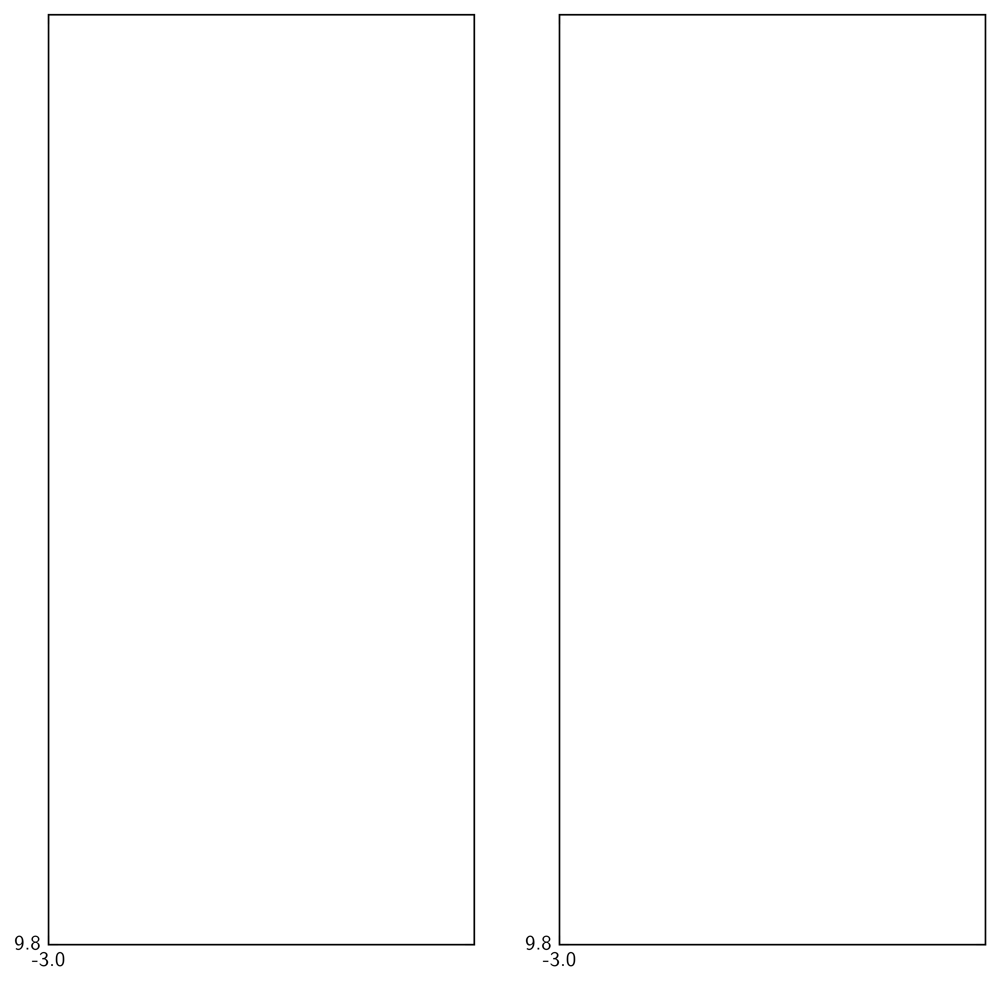

In [50]:
shrink_cbar = 0.36

tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
tickp = TickProperties(SZX=True,SZY=True,\
                       xtick_step_major=15,\
                        xtick_step_minor=5,\
                            ytick_step_major=15,\
                                ytick_step_minor=5)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
setup.fig_width= 20.6*cm
setup.fig_height=20.6*cm #29.1*cm
setup.DEFAULT_HEAT_EXTEND = (-0.5,60.5,60.5,-0.5)#im1.get_extent()#
fig, ax = setup.return_fig(shape=(1,2),dots_per_inch=600) 
# im1 = ax[0].imshow(g_cutarray[:,:,0,0],extent=(-0.5,60.5,60.5,-0.5))
# im1 = ax[0].imshow(xsol_kcut[:,:,0])
im1 = ax[0].imshow(xsol_gcut[:,:,0],extent=setup.DEFAULT_HEAT_EXTEND)
# im1 = ax[0].imshow(k_cutarray[:,:,0,0],extent=(-0.5,60.5,60.5,-0.5))
colorbar = fig.colorbar(im1,ax=ax[0],shrink=shrink_cbar)
# im2 = ax[1].imshow(k_cutarray[:,:,0,0],extent=(-0.5,60.5,60.5,-0.5))

# tickformat2 = Format(xscale=d,yscale=w,xprec="{:.1f}",yprec="{:.1f}")
# tickformat2.numb_xticks = tickformat.numb_xticks
# tickformat2.numb_yticks = tickformat.numb_yticks

# ax[1].yaxis.set_major_formatter(ticker.FuncFormatter(tickformat2.formaty1))  
# im2 = ax[1].imshow(xsol_gcut[:,:,0])
im2 = ax[1].imshow(stab_xsol_gcut[:,:],extent=setup.DEFAULT_HEAT_EXTEND)
colorbar2 = fig.colorbar(im2,ax=ax[1],shrink=shrink_cbar)
x_pos= 64
y_pos= -6
# ax[0].text(x=x_pos,y=y_pos,s=r'$m_x$')
# ax[1].text(x=x_pos,y=y_pos,s=r'$m_x$')
# # ax[0].set_title(r'(a) $\omega={:.2f}$, $\kappa={:d}$'.format(omega_cut,kappa_cut1),fontsize=9,loc='center',y=-0.28)
# # ax[1].set_title(r'(b) $\kappa={:d}$, $\gamma={:d}$'.format(kappa_cut2,gamma_cut),fontsize=9,loc='center',y=-0.28)
# ax[0].set_xlabel(r'$\delta$')
# ax[1].set_xlabel(r'$\delta$')
# ax[0].set_ylabel(r'$\gamma$',rotation=0,labelpad=10)
# ax[1].set_ylabel(r'$\omega$',rotation=0,labelpad=10)
# xg = np.linspace(0,g_border[0,1]+1)
# xg = np.linspace(0,90)
ax[1].plot(spline(xg,*g_sp_param[0]),xg,color='0',linestyle=(0, (5, 10)),linewidth=1)
# ax[1].scatter(g_border[:,1],g_border[:,0],s=10,color='0')
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'limit_cycle_mean_gw.png',bbox_inches='tight')
plt.show()

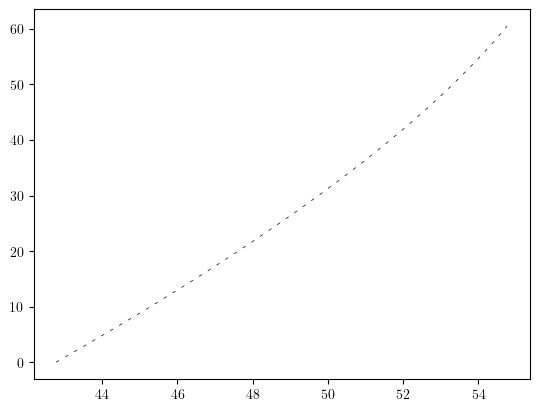

In [36]:
g_border = []
# w_border = []
for i in range(stab_xsol_gcut.shape[0]):
    for j in range(stab_ysol_gcut.shape[1]):
        if (not np.isnan(stab_xsol_gcut[i,j])) and np.isnan(stab_xsol_gcut[i,j-1]):
            g_border.append([i/90*60.5,j/90*60.5])
        # if (not np.isnan(stab_xsol_wcut[i,j])) and np.isnan(stab_xsol_wcut[i-1,j]):
        #     w_border.append([i/90*60.5,j/45*60.5])
g_border = np.array(g_border)
# w_border = np.array(w_border)

# def spline(x,*a):
#     res = a[0]
#     for i in range(1,len(a)):
#         res += a[i]*x**(1/i)
#     return res

def spline(x,*a):
    res = 0
    for i in range(len(a)):
        res += a[i]*x**i
    return res
from scipy.optimize import curve_fit
from scipy.interpolate import CubicSpline
steps = -3
g_sp_param = curve_fit(spline,g_border[::steps,0],g_border[::steps,1],p0=np.zeros(4))
# w_sp_param = curve_fit(spline,w_border[::steps,1],w_border[::steps,0],p0=np.zeros(4))
xg = np.linspace(0,60.5)
plt.figure()
plt.plot(spline(xg,*g_sp_param[0]),xg,color='0',linestyle=(0, (5, 10)),linewidth=0.5)
plt.show()

(90, 90, 3, 33)


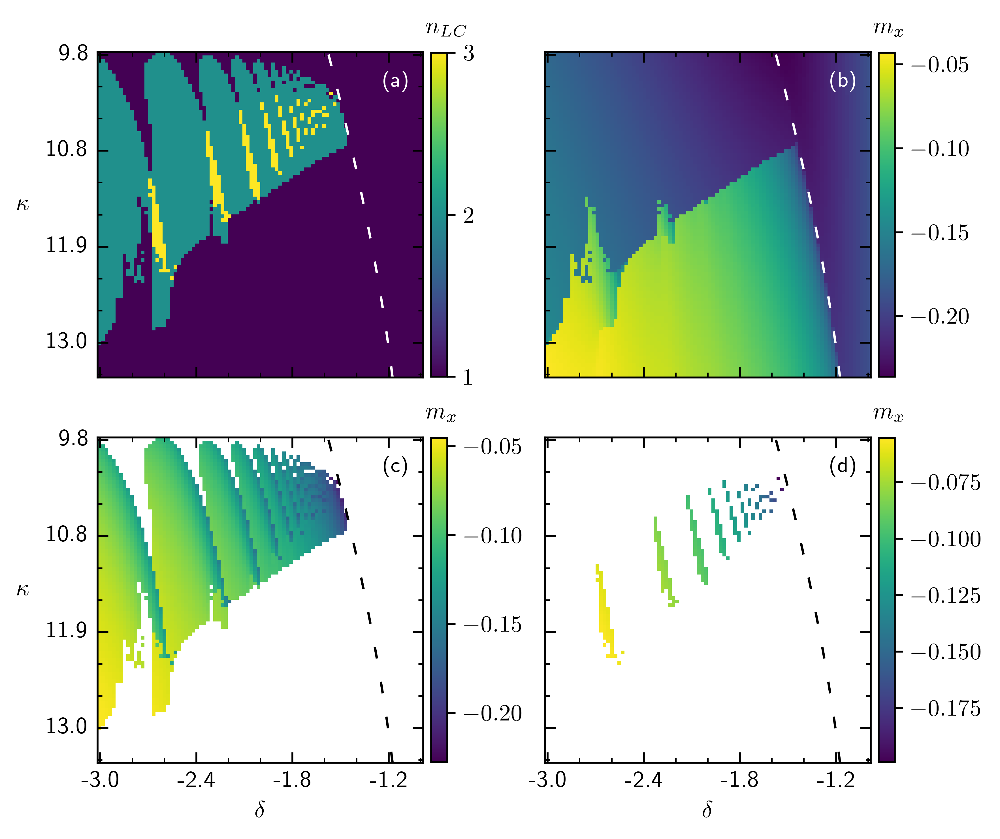

In [ ]:
# w_cutarray2 = alternative
# w_cutarray2 = np.load('4.4k13_1.5w5.5_3d/w_cut_aver_p_corrected4.npy')
w_cutarray2 = np.load('4.4k13_1.5w5.5_3d/DOP_w_cut_aver_p.npy')
# w_cutarray2 = np.load('gamma_var/g_cut_aver_p.npy')
# k_cutarray = np.load('gamma_var/w_cut_aver_p.npy')
# w_cutarray2 = np.zeros_like(w_cutarray3)
# w_cutarray2 = w_cutarray3
# period_found2 = np.load('4.4k13_1.5w5.5_3d/w_cut_period_status2.npy')
w_cutarray = np.zeros_like(w_cutarray2)
numberc_w = np.zeros((w_cutarray2.shape[0],w_cutarray2.shape[1]))
period_found = np.zeros_like(numberc_w)
gridpoints = w_cutarray2.shape[0]
print(w_cutarray.shape)
k = np.linspace(9.751111111111111, 13.0,gridpoints)
d = np.linspace(-3.0, -1.2,gridpoints)
w = 2.3889
def fill(m,n):
    gap = n-len(m)
    return m+gap*[np.array([np.nan,np.nan,np.nan])]#[m[0]]
def count_cycles(m,numb):
    
    # print(m.shape)
    s = dist(m,5*1e-3)
    # print(s)
    if not s:
        return 0, np.zeros((3,numb))
    if len(s)<=1:
        # print(s)
        s = s[0]
        return 1, np.array(numb*[s]).T
    # print(len(s))
    elif len(s)<numb:
        # print(s)
        return len(s), np.sort(np.array(fill(s,numb)).T,axis=1)
    s = np.array(s).T
    # print(s.shape[1])
    s = np.sort(s,axis=1)
    return s.shape[1], s


interesting = []
for i in range(w_cutarray2.shape[0]):
    for j in range(w_cutarray2.shape[0]):
        numberc_w[i,j], w_cutarray[i,j,:] = count_cycles(w_cutarray2[i,j],33)
        
        if i<10 and j>62 and j<67:
            if numberc_w[i,j]>1:
                # print(i,j)
                numberc_w[i,j]=1
                interesting.append((k[i],d[j]))
        if numberc_w[i,j]==1:
            w_cutarray[i,j,:,1:] = np.nan
        elif numberc_w[i,j]==2:
            w_cutarray[i,j,:,2:] = np.nan
        elif numberc_w[i,j]==3:
            w_cutarray[i,j,:,3:] = np.nan


        
        #     numberc_w[i,j]=8
        # if i==krow and np.any(j==np.array(intersting_j)):
        #     numberc_w[i,j]=-1
        # # a, b=count_cycles(w_cutarray2[i,j],15)
        # print(b.shape)
        # period_found[i,j] = period_found2.shape[2]-np.sum(period_found2[i,j])


def area_select(i,j):
    i , j = int(i), int(j)
    l = numberc_w.shape[0]
    hit_count = 0
    for n in range(2):
        if numberc_w[min(int(i+n),l-1),j]==1 or numberc_w[max(0,int(i-n)),j]==1:
            hit_count+=1
        if numberc_w[min(int(i+n),l-1),j]>1 or numberc_w[max(0,int(i-n)),j]>1:
            hit_count-=1
    # if hit_count>1:
    #     return True
    # hit_count = 0
    for n in range(2):
        if numberc_w[i,min(int(j+n),l-1)]==1 or numberc_w[i,max(0,int(j-n))]==1:
            hit_count+=1
        if numberc_w[i,min(int(j+n),l-1)]>1 or numberc_w[i,max(0,int(j-n))]>1:
            hit_count-=1
    if np.abs(hit_count)<3:
        return True
    return False
selected_area = np.zeros_like(numberc_w)
for i in range(w_cutarray2.shape[0]):
    for j in range(w_cutarray2.shape[0]):
        selected_area[i,j] = area_select(i,j)
            # w_cutarray[i,j,:] = np.sort(w_cutarray3[i,j])


tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp = TickProperties(SZX=True,SZY=True,\
                       xtick_step_major=18,\
                        xtick_step_minor=6,\
                            ytick_step_major=18,\
                                ytick_step_minor=6)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
plot_dim = (-0.5, 60.5, 60.5, -0.5)
setup.fig_width= 17.5*cm
setup.fig_height=20.6*cm #29.1*cm
# im = plt.imshow(numberc_w)
# # plt.hlines(14,id1+2,id2-3)
# plt.hlines(10,60,70)
# plt.vlines(67,0,50)
# plt.vlines(62,0,50)
# plt.arrow(0,10,3,0,color='1',head_width=0.8,head_length=1,facecolor='0')
heat_extent = plot_dim
setup.DEFAULT_HEAT_EXTEND =  heat_extent
fig, ax = setup.return_fig(shape=(2,2),dots_per_inch=600,yax_share='all',joined=True)
title = [['(a)','(b)'],['(c)','(d)']]
shrink_cbar = 0.54
padi=0.02
x_pos = 61
y_pos = -4
trash, xw, yw, trash=heat_extent#im1.get_extent()#
numb_xticks = xw//tickp.major_xtick_step
numb_yticks = yw//tickp.major_ytick_step
im1 = ax[0,1].imshow(w_cutarray[:,:,0,0],extent=plot_dim)
cbar1 = fig.colorbar(im1,ax=ax[0,1],orientation='vertical',shrink=shrink_cbar,pad=padi)
ax[0,1].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=False,labelright=False)
# ax[0,1].set_xlabel(r'$\delta$')
ax[0,1].text(x_pos,y_pos,r'$m_x$')
im2 = ax[0,0].imshow(numberc_w,extent=plot_dim)
ax[0,0].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=True)
cbar2 = fig.colorbar(im2,ax=ax[0,0],orientation='vertical',shrink=shrink_cbar,ticks=[1,2,3],pad=padi)
# ax[0,0].set_xlabel(r'$\delta$')
ax[0,0].text(x_pos,y_pos,r'$n_{LC}$')
ax[0,0].set_ylabel(r'$\kappa$',rotation=0,labelpad=10)
# ax[0,0].arrow(0,10,3,0,color='1',head_width=0.8,head_length=1,facecolor='1')
# ax[0,0].arrow(50,36,-3,0,color='1',head_width=0.8,head_length=1,facecolor='1')

im3 = ax[1,0].imshow(w_cutarray[:,:,0,1],extent=plot_dim)#+4*(1-numberc_w))
# im3 = ax[1,0].imshow(selected_area)#+4*(1-numberc_w))
ax[1,0].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=True)
ax[1,0].set_xlabel(r'$\delta$')
ax[1,0].text(x_pos,y_pos,r'$m_x$')
ax[1,0].set_ylabel(r'$\kappa$',rotation=0,labelpad=10)
cbar3 = fig.colorbar(im3,ax=ax[1,0],orientation='vertical',shrink=shrink_cbar,pad=padi)
# ax[1,0].hlines(6,0,50)
im4 = ax[1,1].imshow(w_cutarray[:,:,0,2],extent=plot_dim)#+4*(1-numberc_w))
# im3 = ax[1,1].imshow(selected_area)#+4*(1-numberc_w))
ax[1,1].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=False)
ax[1,1].set_xlabel(r'$\delta$')
ax[1,1].text(x_pos,y_pos,r'$m_x$')
cbar4 = fig.colorbar(im4,ax=ax[1,1],orientation='vertical',shrink=shrink_cbar,pad=padi)
ax[1,1].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=False,labelright=False)
# ax[1,1].hlines(6,0,50)
plt.subplots_adjust(wspace=0.14,hspace=-0.37)
xg = np.linspace(0,60.5)
for i in range(2):
    for j in range(2):
        if i<1:
            ax[i,j].plot(spline(xg,*g_sp_param[0]),xg,color='1',linestyle=(0, (5, 10)),linewidth=1)
            ax[i,j].set_title(title[i][j],x=0.92,y=0.85,fontsize=9,color='1')
        else:
            ax[i,j].plot(spline(xg,*g_sp_param[0]),xg,color='0',linestyle=(0, (5, 10)),linewidth=1)
            ax[i,j].set_title(title[i][j],x=0.92,y=0.85,fontsize=9,color='0')
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'limit_cycle_mean.png',bbox_inches='tight')
plt.show()

In [ ]:
# w_cutarray2 = alternative
# w_cutarray2 = np.load('4.4k13_1.5w5.5_3d/w_cut_aver_p_corrected4.npy')
w_cutarray2 = np.load('4.4k13_1.5w5.5_3d/DOP_w_cut_aver_p.npy')
# w_cutarray2 = np.load('gamma_var/g_cut_aver_p.npy')
# k_cutarray = np.load('gamma_var/w_cut_aver_p.npy')
# w_cutarray2 = np.zeros_like(w_cutarray3)
# w_cutarray2 = w_cutarray3
# period_found2 = np.load('4.4k13_1.5w5.5_3d/w_cut_period_status2.npy')
w_cutarray = np.zeros_like(w_cutarray2)
numberc_w = np.zeros((w_cutarray2.shape[0],w_cutarray2.shape[1]))
period_found = np.zeros_like(numberc_w)
gridpoints = w_cutarray2.shape[0]
print(w_cutarray.shape)
k = np.linspace(9.751111111111111, 13.0,gridpoints)
d = np.linspace(-3.0, -1.2,gridpoints)
w = 2.3889
def fill(m,n):
    gap = n-len(m)
    return m+gap*[np.array([np.nan,np.nan,np.nan])]#[m[0]]
def count_cycles(m,numb):
    
    # print(m.shape)
    s = dist(m,5*1e-3)
    # print(s)
    if not s:
        return 0, np.zeros((3,numb))
    if len(s)<=1:
        # print(s)
        s = s[0]
        return 1, np.array(numb*[s]).T
    # print(len(s))
    elif len(s)<numb:
        # print(s)
        return len(s), np.sort(np.array(fill(s,numb)).T,axis=1)
    s = np.array(s).T
    # print(s.shape[1])
    s = np.sort(s,axis=1)
    return s.shape[1], s


interesting = []
for i in range(w_cutarray2.shape[0]):
    for j in range(w_cutarray2.shape[0]):
        numberc_w[i,j], w_cutarray[i,j,:] = count_cycles(w_cutarray2[i,j],33)
        
        if i<10 and j>62 and j<67:
            if numberc_w[i,j]>1:
                # print(i,j)
                numberc_w[i,j]=1
                interesting.append((k[i],d[j]))
        if numberc_w[i,j]==1:
            w_cutarray[i,j,:,1:] = np.nan
        elif numberc_w[i,j]==2:
            w_cutarray[i,j,:,2:] = np.nan
        elif numberc_w[i,j]==3:
            w_cutarray[i,j,:,3:] = np.nan


        
        #     numberc_w[i,j]=8
        # if i==krow and np.any(j==np.array(intersting_j)):
        #     numberc_w[i,j]=-1
        # # a, b=count_cycles(w_cutarray2[i,j],15)
        # print(b.shape)
        # period_found[i,j] = period_found2.shape[2]-np.sum(period_found2[i,j])


def area_select(i,j):
    i , j = int(i), int(j)
    l = numberc_w.shape[0]
    hit_count = 0
    for n in range(2):
        if numberc_w[min(int(i+n),l-1),j]==1 or numberc_w[max(0,int(i-n)),j]==1:
            hit_count+=1
        if numberc_w[min(int(i+n),l-1),j]>1 or numberc_w[max(0,int(i-n)),j]>1:
            hit_count-=1
    # if hit_count>1:
    #     return True
    # hit_count = 0
    for n in range(2):
        if numberc_w[i,min(int(j+n),l-1)]==1 or numberc_w[i,max(0,int(j-n))]==1:
            hit_count+=1
        if numberc_w[i,min(int(j+n),l-1)]>1 or numberc_w[i,max(0,int(j-n))]>1:
            hit_count-=1
    if np.abs(hit_count)<3:
        return True
    return False
selected_area = np.zeros_like(numberc_w)
for i in range(w_cutarray2.shape[0]):
    for j in range(w_cutarray2.shape[0]):
        selected_area[i,j] = area_select(i,j)
            # w_cutarray[i,j,:] = np.sort(w_cutarray3[i,j])


tickformat = Format(xscale=d,yscale=k,xprec="{:.1f}",yprec="{:.1f}")
# plots = [stab_xsol,stab_ysol,stab_zsol]
tickp = TickProperties(SZX=True,SZY=True,\
                       xtick_step_major=18,\
                        xtick_step_minor=6,\
                            ytick_step_major=18,\
                                ytick_step_minor=6)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp,formater=tickformat)
plot_dim = (-0.5, 60.5, 60.5, -0.5)
setup.fig_width= 16.2*cm
setup.fig_height=16*cm #29.1*cm
# im = plt.imshow(numberc_w)
# # plt.hlines(14,id1+2,id2-3)
# plt.hlines(10,60,70)
# plt.vlines(67,0,50)
# plt.vlines(62,0,50)
# plt.arrow(0,10,3,0,color='1',head_width=0.8,head_length=1,facecolor='0')
heat_extent = plot_dim
setup.DEFAULT_HEAT_EXTEND =  heat_extent
fig, ax = setup.return_fig(shape=(2,2),dots_per_inch=600,yax_share='all',joined=True)
title = [['(a)','(b)'],['(c)','(d)']]
shrink_cbar = 0.74
padi=0.02
x_pos = 61
y_pos = -4
trash, xw, yw, trash=heat_extent#im1.get_extent()#
numb_xticks = xw//tickp.major_xtick_step
numb_yticks = yw//tickp.major_ytick_step
im1 = ax[0,1].imshow(w_cutarray[:,:,0,0],extent=plot_dim)
cbar1 = fig.colorbar(im1,ax=ax[0,1],orientation='vertical',shrink=shrink_cbar,pad=padi)
ax[0,1].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=False,labelright=False)
# ax[0,1].set_xlabel(r'$\delta$')
ax[0,1].text(x_pos,y_pos,r'$m_x$')
im2 = ax[0,0].imshow(numberc_w,extent=plot_dim)
ax[0,0].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=True)
cbar2 = fig.colorbar(im2,ax=ax[0,0],orientation='vertical',shrink=shrink_cbar,ticks=[1,2,3],pad=padi)
# ax[0,0].set_xlabel(r'$\delta$')
ax[0,0].text(x_pos,y_pos,r'$n_{LC}$')
ax[0,0].set_ylabel(r'$\kappa$',rotation=0,labelpad=10)
# ax[0,0].arrow(0,10,3,0,color='1',head_width=0.8,head_length=1,facecolor='1')
# ax[0,0].arrow(50,36,-3,0,color='1',head_width=0.8,head_length=1,facecolor='1')

im3 = ax[1,0].imshow(w_cutarray[:,:,0,1],extent=plot_dim)#+4*(1-numberc_w))
# im3 = ax[1,0].imshow(selected_area)#+4*(1-numberc_w))
ax[1,0].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=True)
ax[1,0].set_xlabel(r'$\delta$')
ax[1,0].text(x_pos,y_pos,r'$m_x$')
ax[1,0].set_ylabel(r'$\kappa$',rotation=0,labelpad=10)
cbar3 = fig.colorbar(im3,ax=ax[1,0],orientation='vertical',shrink=shrink_cbar,pad=padi)
# ax[1,0].hlines(6,0,50)
im4 = ax[1,1].imshow(w_cutarray[:,:,0,2],extent=plot_dim)#+4*(1-numberc_w))
# im3 = ax[1,1].imshow(selected_area)#+4*(1-numberc_w))
ax[1,1].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=False)
ax[1,1].set_xlabel(r'$\delta$')
ax[1,1].text(x_pos,y_pos,r'$m_x$')
cbar4 = fig.colorbar(im4,ax=ax[1,1],orientation='vertical',shrink=shrink_cbar,pad=padi)
ax[1,1].tick_params(axis='y',direction='in',which='both',bottom=True,top=True,labelleft=False,labelright=False)
# ax[1,1].hlines(6,0,50)
plt.subplots_adjust(wspace=0.14,hspace=-0.12)
xg = np.linspace(0,60.5)
for i in range(2):
    for j in range(2):
        if i<1:
            ax[i,j].plot(spline(xg,*g_sp_param[0]),xg,color='1',linestyle=(0, (5, 10)),linewidth=1)
            ax[i,j].set_title(title[i][j],x=0.92,y=0.85,fontsize=9,color='1')
        else:
            ax[i,j].plot(spline(xg,*g_sp_param[0]),xg,color='0',linestyle=(0, (5, 10)),linewidth=1)
            ax[i,j].set_title(title[i][j],x=0.92,y=0.85,fontsize=9,color='0')
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'limit_cycle_mean.png',bbox_inches='tight')
plt.show()

(10.118909853249477, -2.2867924528301886, -1.8113207547169812)

In [111]:
def fill_binary(length,numb):
    diff = length -len('{:b}'.format(numb))
    if diff:
        return diff*'0'
    else:
        return ''

def starting_grid(expansion,resolution):
    # points = np.zeros((resolution,resolution,resolution,3))
    flat = []
    stepsize = expansion/(resolution-1)
    for i in range(resolution):
        for j in range(resolution):
            for l in range(resolution):
                a = 0b000
                for n in range(7):
                    b = '{}{:b}'.format(fill_binary(3,a),a)
                    b= np.array([*b],dtype=np.int32)
                    a +=1
                    # print(1-2*b)
                    # print(np.array([i,j,l])*(1-2*b))
                    p1 = np.array([i,j,l])*(1-2*b)*stepsize
                    if np.linalg.norm(p1)<=0.5:
                        flat.append(p1)
    out = [flat[0]]
    for i in range(1,len(flat)):
        take = 1
        for j in range(len(out)):
            if np.linalg.norm(flat[i]-out[j])==0:
                # print('sorted out')
                take =0
        if take:
            out.append(flat[i])

    return np.row_stack(out)

start = starting_grid(0.62,4)
start.shape

(56, 3)

In [37]:
numb_of_tsteps =10000
trajec = np.zeros((len(interesting),start.shape[0],4,numb_of_tsteps))
from multiprocessing import Pool

def wrapper(index):
    arguments = w, interesting[index][0], interesting[index][1], 1, 0.2
    traj = np.zeros((start.shape[0],4,numb_of_tsteps))
    for i, s in enumerate(start):
        tr = solve_ivp(gl2,(0,20000),y0=s,args=arguments,method='DOP853',t_eval=np.linspace(16000,20000,numb_of_tsteps),rtol=1e-10)
        traj[i] = np.row_stack((tr.t,tr.y))
    return traj
po = Pool(9)
result = po.imap(wrapper,np.arange(len(interesting)),chunksize=1)
for i, res in enumerate(result):
    trajec[i] = res



In [38]:
from search_root2d_w_cut import *
from lcycle_to_fixp_period_w_cuts import *
roots = np.zeros((len(interesting),3,5))
solution_n = np.zeros((len(interesting)))
stab = np.zeros((len(interesting),5))
stab_plus = np.zeros_like(solution_n)
for i, [kval, dval] in enumerate(interesting):
    solution_n[i], x, y = root2d(kval,w,dval,0.2)
    for j in range(int(solution_n[i])):
        roots[i,0,j]= x[j]
        roots[i,1,j]= y[j]
        roots[i,2,j]= m_z(x[j],y[j],w,kval,1)
    stab[i], stab_plus[i] =determine_stability(solution_n[i],roots[i,0,:],roots[i,1,:],w,kval,dval,0.2)

            
    if stab_plus[i]:
                # print(kval,wval,dval)
        for n in range(int(solution_n[i])):
            if stab[i,n]==2:
                roots[i,:,-1]=roots[i,:,n]
                break
print(stab_plus)

[0. 0. 0. 0. 0. 0. 0.]


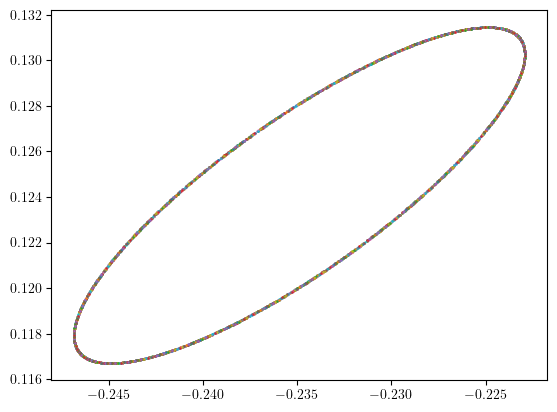

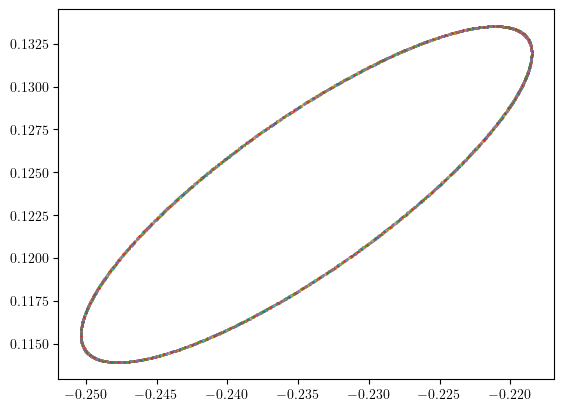

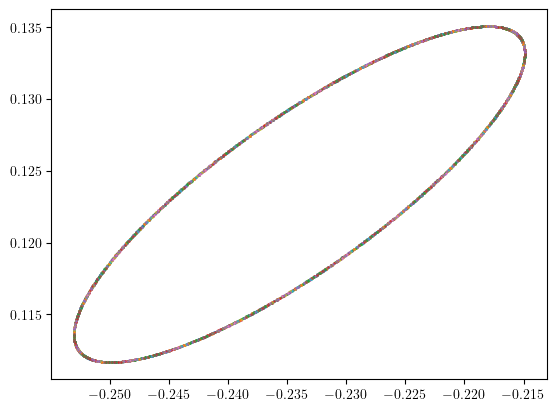

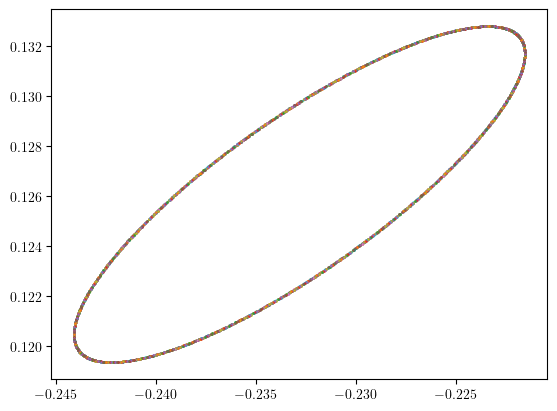

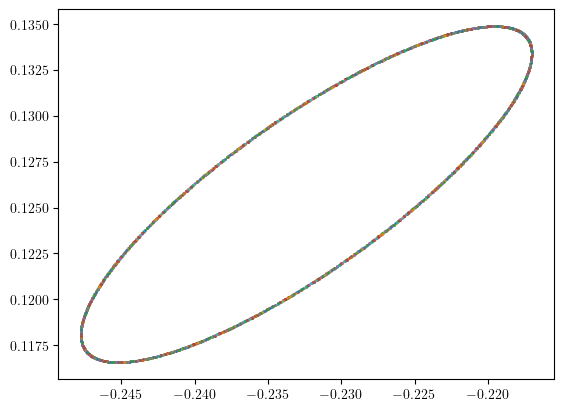

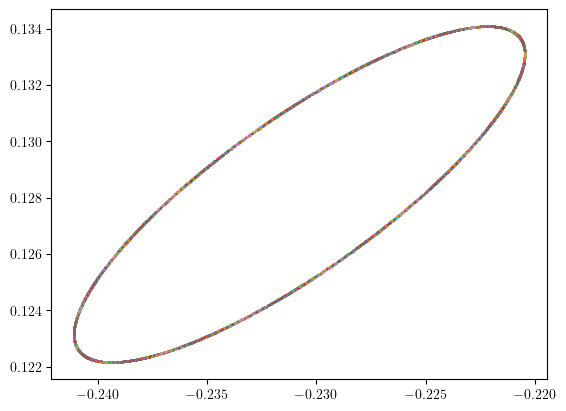

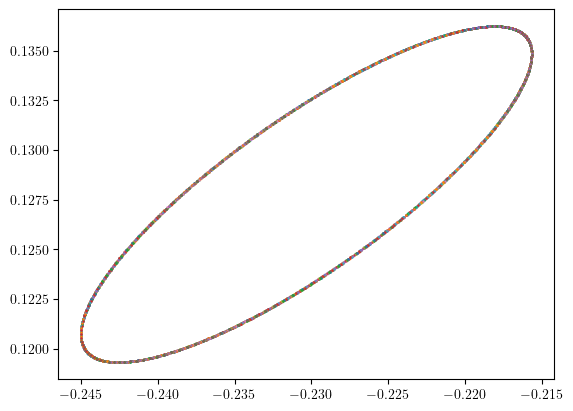

In [40]:
for trajs in trajec:
    plt.figure()
    a = np.zeros(start.shape[0])
    for i in range(start.shape[0]):
        a[i] = np.linalg.norm(np.std(trajs[i,1:],axis=1))
    b = np.sort(a)
    # print(b)
    for i in range(start.shape[0]):
        
        # if a[i]<=b[0]+0.01:
        plt.scatter(trajs[i,1,::100],trajs[i,2,::100])
    plt.show()
    

In [108]:
np.save('4.4k13_1.5w5.5_3d/'+'w_cut_number_of_lc_corrected',numberc_w)

In [57]:
import numpy as np
w_traj2 = np.zeros((18,54,15,10000,4))
subgrid =54//3
i = 0
for j in range(3):
    w_traj2[i*subgrid:(i+1)*subgrid,j*subgrid:(j+1)*subgrid] = np.load('4.4k13_1.5w5.5_3d/'+f'w_cut_traj_p_{1}_{j}.npz')['arr_0']




FileNotFoundError: [Errno 2] No such file or directory: '4.4k13_1.5w5.5_3d/w_cut_traj_p_1_0.npz'

In [ ]:
w_traj = np.zeros_like(w_traj2)

i=0
for j in range(3):
    for n in range(subgrid):
        ink, ind = subgrid*i+j*subgrid//3+ n//3, subgrid%3+ n%3
        w_traj[ink,ind*subgrid:ind*subgrid+subgrid] = w_traj2[i*subgrid+n,j*subgrid:subgrid*(j+1)]
np.savez_compressed('4.4k13_1.5w5.5_3d/'+f'w_traj_period_row_{0}',w_traj)       

In [139]:
w_traj = np.load('4.4k13_1.5w5.5_3d/'+'w_cut_traj_p_corrected_row0.npz')['arr_0']

[-0.1121927   0.02600812  0.09901773]
[-0.1121564   0.02601572  0.09901807]
[-0.11219211  0.02600323  0.09902353]
[-0.11220791  0.02599919  0.09901685]
[-0.11216607  0.02601088  0.09902019]
[-0.11215268  0.02601376  0.09902046]
[-0.11219229  0.02600631  0.09901691]
[-0.17190859  0.01618741  0.10251785]
[-0.11219226  0.02600454  0.09902056]
[-0.11216466  0.02601078  0.09900227]
[-0.11219252  0.02598855  0.09900427]
[-0.17191897  0.0161941   0.10248043]
[-0.17190131  0.01619295  0.10252336]
[-0.17191741  0.01619138  0.10247748]
[-0.17191139  0.01620206  0.1024735 ]
[-0.1121769   0.0260156   0.09900453]
[-0.11218933  0.02600543  0.09904166]
[-0.17190943  0.01621063  0.10247606]
[-0.17191578  0.0161829   0.10250139]
[-0.11216585  0.02598966  0.0990184 ]
[-0.11214549  0.02599234  0.09902086]
[-0.17190891  0.01619064  0.10251841]
[-0.17191762  0.01618257  0.10249017]
[-0.1121432   0.02599536  0.09902027]
[-0.11217328  0.02601549  0.09904633]
[-0.17191851  0.01619062  0.102484  ]
[-0.11218394

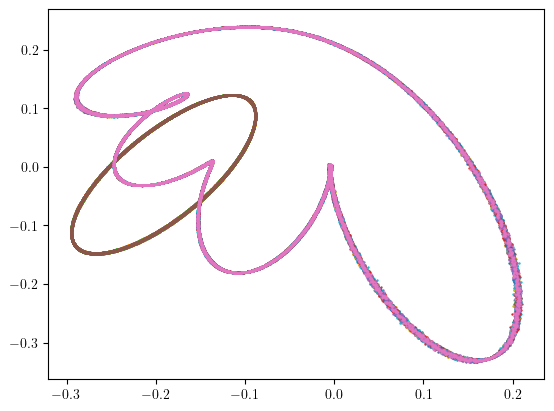

In [ ]:
plt.figure()
traj = w_traj[4,2]
for i in range(w_traj.shape[2]):
    plt.scatter(traj[i,:,1],traj[i,:,2])
    print(np.mean(traj[i,:,1:],axis=0))
plt.show()
# [-0.17190662,  0.        ,  0.        ]),
#   array([-0.11218563,  0.        ,  0.        ]),
#   array([0.        , 0.01620076, 0.09902166]),
#   array([0.        , 0.02599476, 0.10250042])],

In [141]:
wt = np.zeros((gridpoints,gridpoints,15,w_traj2.shape[3],4))
wt[0:subgrid,subgrid:2*subgrid] = w_traj2
i=1
j=2
w_traj = np.zeros((gridpoints,gridpoints,15,w_traj2.shape[3],4))
w_traj.shape
for n in range(subgrid):
    ink, ind = subgrid*i+j*subgrid//3+ n//3, subgrid%3+ n%3
    w_traj[ink,ind*subgrid:ind*subgrid+subgrid] = wt[i*subgrid+n,j*subgrid:subgrid*(j+1)]

In [38]:
gridx = 0
gridy = 1
subgrid = 18
i_mat = np.zeros((subgrid,subgrid))
for row in range(subgrid):
    i_mat[row,:] = np.arange(subgrid)+subgrid*3*row+3*subgrid**2*gridx+subgrid*gridy
b = np.reshape(np.arange(gridpoints**2),(gridpoints,gridpoints))
c = b[gridx*subgrid:(gridx+1)*subgrid,gridy*subgrid:(gridy+1)*subgrid]-i_mat
print(c)
np.all(c==0)
# np.reshape(np.arange(5**2),(5,5))
# i_mat

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

True

In [139]:
for i1 in range(w_cutarray.shape[0]):
    for j1 in range(w_cutarray.shape[1]):
        if numberc_w[i1,j1]>=6:
            print(i1,j1)

19 41
21 42
24 6
24 43
28 44
36 9


9.812410901467505 -1.6075471698113208 1 41


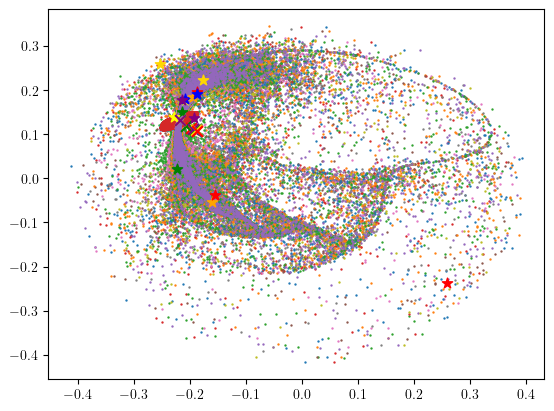

9.935010482180294 -1.5735849056603775 3 42


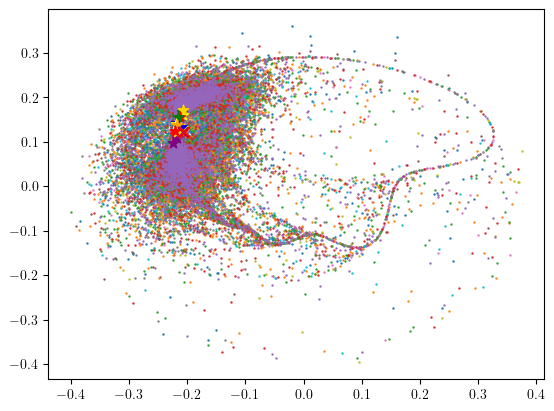

10.118909853249477 -2.7962264150943397 6 6


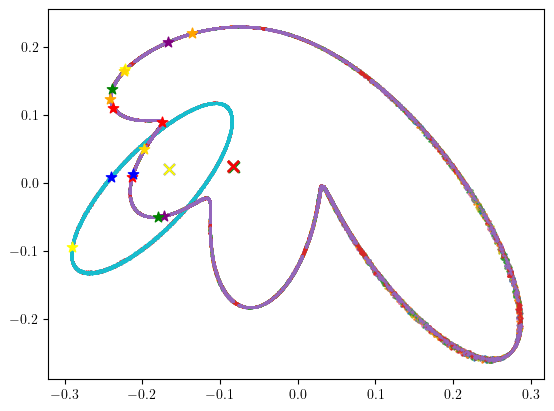

10.118909853249477 -1.539622641509434 6 43


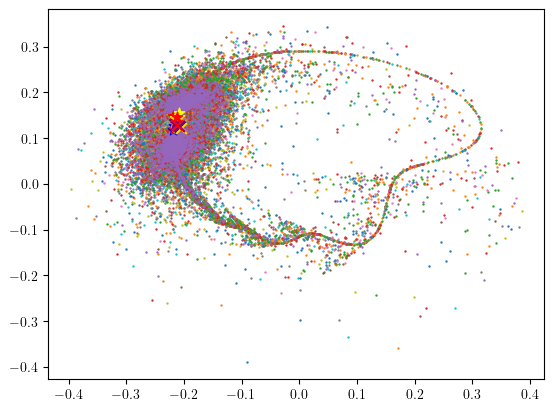

10.364109014675053 -1.5056603773584907 10 44


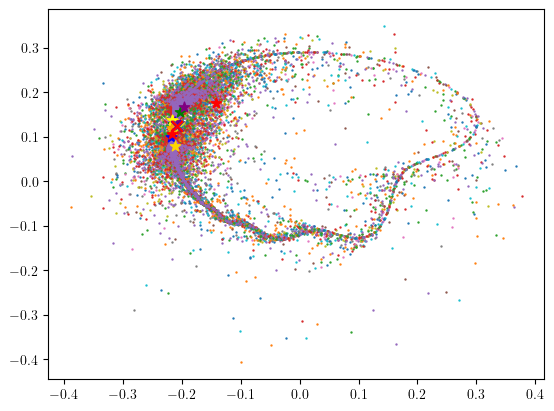

In [30]:
# alternative = np.zeros_like(w_cutarray)
for i1 in range(w_cutarray.shape[0]):
    for j1 in range(w_cutarray.shape[1]):
        # alternative[i,j,:,:] = np.mean(w_traj[i,j,:,:,1:],axis=1).T
        # if period_found[i,j]>0:
        colors = ['red','green','yellow','blue','gold','orange','purple']
        l = len(colors)
        if numberc_w[i1,j1]>=6 and i1>=18 and i1<36:# and i1<15 and j1==30:
        # if i1==5 and j1>subgrid and j1<subgrid*2:#numberc_w[i,j]>=3 and i ==12:
            i=i1-subgrid
            j =j1
        #     print(period_found[i,j])
            print(k[i],d[j],i,j)
            steps = w_traj.shape[3]
            fig, ax = plt.subplots(1,1)
            for n in range(15):#0,3,4]:
                
                # for n in range(int(period_found[i,j])):
                ax.scatter(w_traj[i,j,n,:steps,1],w_traj[i,j,n,:steps,2])
            for n in range(15):
                if period_found2[i,j,n]==0:
                    ax.scatter(w_traj[i,j,n,0,1],w_traj[i,j,n,0,2],s=30,color='0')
                else:
                    ax.scatter(w_traj[i,j,n,0,1],w_traj[i,j,n,0,2],s=60,marker="*",color=colors[n%l])
                ax.scatter(w_cutarray2[i1,j1,0,n],w_cutarray2[i1,j1,1,n],s=60,marker="x",color=colors[n%l])
            # fig, ax = plt.subplots(1,1)
            
            # for n in range(5):
            #     # for n in range(int(period_found[i,j])):
            #     ax.scatter(w_traj[i,j,n,:steps,0],w_traj[i,j,n,:steps,1])
            plt.show()

In [19]:
kval, wval, dval = 10.241509433962264, 2.388889, -2.0150943396226415
# kval, wval, dval =10.670607966457023,2.3888889, -2.728301886792453
# kval, wval, dval = k[krow], 2.38888889, d[intersting_j[5]]
time_range = int(1.5e4)
numb_of_points = 27
trajs = np.zeros((numb_of_points,4,time_range))
def starting_points2(numb):
    points = np.zeros((numb,3))
    for i in range(numb):
        phi = random()*2*np.pi
        theta = random()*np.pi
        r = random()*0.5
        points[i,:] = r*np.sin(theta)*np.cos(phi), r*np.sin(theta)*np.sin(phi), r*np.cos(theta)
    return points
def starting_points(gridr,gridthet,gridphi):
    points = np.zeros((gridr,gridthet,gridphi,3))
    r_steps = 0.5/gridr
    phi_steps = 2*np.pi/gridthet
    theta_steps = np.pi/gridphi
    for i in range(gridr):
        for j in range(gridthet):
            for l in range(gridphi):
                phi = random()*phi_steps+j*phi_steps
                theta = random()*theta_steps+l*theta_steps
                r = (i+random())*r_steps
                points[i,j,l,:] = r*np.sin(theta)*np.cos(phi), r*np.sin(theta)*np.sin(phi), r*np.cos(theta)
    return np.reshape(points,(gridr*gridthet*gridphi,3))

starts = starting_points_grid(3,3,3)
# starts = starting_points2(27)
for i in range(starts.shape[0]):
    traj = solve_ivp(gl2,(0,time_range),y0=starts[i,:],args=(wval,kval,dval,1,0.2),method='DOP853',t_eval=np.linspace(9*10**3,time_range,time_range))
    trajs[i,0,:]= traj.t
    trajs[i,1:,:] = traj.y





In [9]:
def starting_points_grid(gridr,gridthet,gridphi):
    points = np.zeros((gridr,gridthet,gridphi,3))
    r_steps = 0.5/gridr
    phi_steps = 2*np.pi/gridthet
    theta_steps = np.pi/gridphi
    for i in range(gridr):
        for j in range(gridthet):
            for l in range(gridphi):
                phi = random()*phi_steps+l*phi_steps+j*0.3*theta_steps
                theta = random()*theta_steps+j*theta_steps+(1-i)*0.3*phi_steps
                r = (i+random())*r_steps
                points[i,j,l,:] = r*np.sin(theta)*np.cos(phi), r*np.sin(theta)*np.sin(phi), r*np.cos(theta)
    return np.reshape(points,(gridr*gridthet*gridphi,3))
starts2 = starting_points_grid(3,3,3)

In [37]:
from scipy.optimize import root_scalar
def delthet(thet):
    return 2*np.cos(thet)-1-np.sin(thet)
res =root_scalar(delthet,bracket=[0,np.pi/2])#,xtol=1e-10)

In [39]:
def phi_grid(n):
    angles = []
    steps = np.pi/n
    for i in range(n):
        angles.append(steps/2+i*steps)
    return np.array(angles)

def theta(angles):
    new_angles = []
    ang0 = 0
    for i in range(len(angles-1)):
        new_angles.append(ang0+(angles[i]-ang0)/2)
        ang0= angles[i]
    new_angles.append(ang0+(np.pi-ang0)/2)
    return np.array(new_angles)

def starting_points():
    delr = 0.5/4
    delthet2 = [np.pi/2]
    delthet3 = [np.arccos(1/3),np.pi-np.arccos(1/3)]
    delthet4 = [res.root,0,np.pi-res.root]
    thets_grid = [delthet2,delthet3,delthet4]
    points = [np.zeros(3)]
    for i in range(1,4):
        phis = phi_grid(i)
        thets = theta(thets_grid[i-1])
        for phi in phis:
            for thet in thets:
                p = [np.sin(thet)*np.cos(phi),np.sin(thet)*np.sin(phi),np.cos(thet)]
                rho = i*delr + delr/2
                points.append(rho*np.array(p))
    return points

                


array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.14810637e-17,  1.87500000e-01,  1.14810637e-17],
       [ 1.27577591e-01,  1.27577591e-01,  2.55155182e-01],
       [ 1.80421959e-01,  1.80421959e-01, -1.80421959e-01],
       [-1.27577591e-01,  1.27577591e-01,  2.55155182e-01],
       [-1.80421959e-01,  1.80421959e-01, -1.80421959e-01],
       [ 1.19814309e-01,  6.91748238e-02,  4.15048943e-01],
       [ 1.19814309e-01,  6.91748238e-02,  4.15048943e-01],
       [ 3.78886114e-01,  2.18750000e-01,  2.67891487e-17],
       [ 8.47147266e-18,  1.38349648e-01,  4.15048943e-01],
       [ 8.47147266e-18,  1.38349648e-01,  4.15048943e-01],
       [ 2.67891487e-17,  4.37500000e-01,  2.67891487e-17],
       [-1.19814309e-01,  6.91748238e-02,  4.15048943e-01],
       [-1.19814309e-01,  6.91748238e-02,  4.15048943e-01],
       [-3.78886114e-01,  2.18750000e-01,  2.67891487e-17]])

15


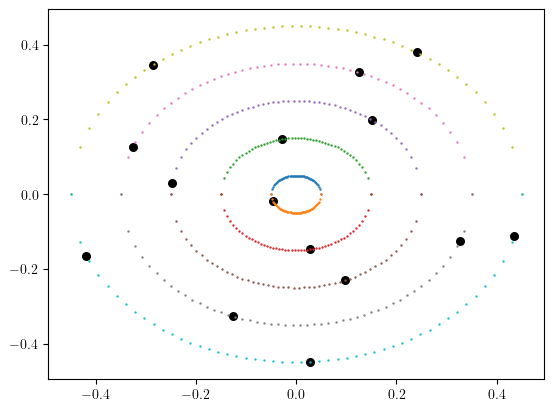

In [23]:
def start_slice(r_numb):
    r_steps = 0.5/r_numb
    points = np.zeros((int((r_numb+1)*r_numb/2),2))
    for i in range(r_numb):
        phi_steps = np.pi*2/(i+1)
        r = (i*r_steps+0.5*r_steps)
        offset = random()*np.pi/4*3
        for j in range(i+1):
            phi = (j+0.5)*phi_steps
            points[int((i+1)*i/2)+j,:]= r*np.cos(phi+offset), r*np.sin(phi+offset)
    return points
numb_of_points =5
st = start_slice(numb_of_points)
print(st.shape[0])
plt.figure()
for s in st:
    plt.scatter(s[0],s[1],s=30,color='0')
for n in range(numb_of_points):
    r=(n+0.5)*0.5/numb_of_points
    x = np.linspace(-r,r)
    y1 = np.sqrt(r**2-x**2)
    y2 = -np.sqrt(r**2-x**2)
    plt.scatter(x,y1)
    plt.scatter(x,y2)
plt.show()

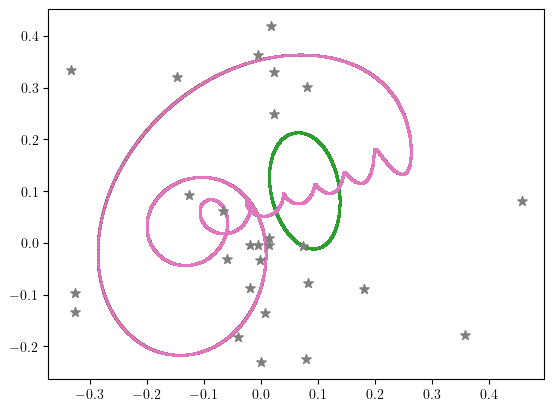

In [20]:
fig, ax = plt.subplots(1,1)
x = 2
y =3
for i in range(numb_of_points):
    # print(trajs[i])
    ax.scatter(trajs[i,x,:],trajs[i,y,:])
# ax.scatter(trajs[7,1,110],trajs[7,2,110],s=50,marker="*")
ax.scatter(starts[:,x-1],starts[:,y-1],s=50,marker="*")
# ax.scatter(starts2[:,0],starts2[:,1],s=50,marker="*")
# sp = trajs[7,1:,110]

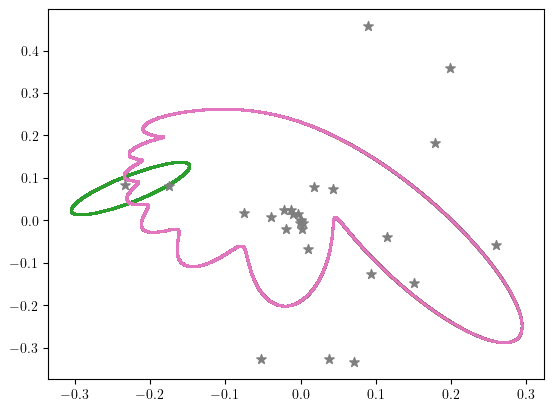

In [21]:
fig, ax = plt.subplots(1,1)
for i in range(numb_of_points):
    ax.scatter(trajs[i,1,:],trajs[i,2,:])
ax.scatter(starts[:,0],starts[:,1],s=50,marker="*")

In [40]:
# starting points
from scipy.optimize import root_scalar
def delthet(thet):
    return 2*np.cos(thet)-1-np.sin(thet)
res =root_scalar(delthet,bracket=[0,np.pi/2])#,xtol=1e-10)


def phi_grid(n):
    angles = []
    steps = 2*np.pi/n
    for i in range(n):
        angles.append(steps/2+i*steps)
    return np.array(angles)

def theta(angles):
    new_angles = []
    ang0 = 0
    for i in range(len(angles)):
        new_angles.append(ang0+(angles[i]-ang0)/2)
        ang0= angles[i]
    new_angles.append(ang0+(np.pi-ang0)/2)
    return np.array(new_angles)

def starting_points():
    delr = 0.5/3
    delthet2 = [np.pi/2]
    delthet3 = [np.arccos(1/3),np.pi-np.arccos(1/3)]
    delthet4 = [res.root,0,np.pi-res.root]
    thets_grid = [delthet2,delthet3,delthet4]
    points = [np.zeros(3)]
    for i in range(3):
        phis = phi_grid(i+2)
        thets = theta(thets_grid[i])
        for phi in phis:
            for thet in thets:
                p = [np.sin(thet)*np.cos(phi),np.sin(thet)*np.sin(phi),np.cos(thet)]
                rho = i*delr + delr/3*2
                points.append(rho*np.array(p))
    return np.array(points)

# starting_points()


In [44]:
# from random import random
# def find_solnumb(numb):
#     indices = []
#     for i in range(numberc_w.shape[0]):
#         for j in range(numberc_w.shape[1]):
#             if numberc_w[i,j]==numb:
#                 indices.append([i,j])
#     indx = int(random()*len(indices))
#     return indices[indx]

def starting_grid(resolution):
    points = np.zeros((resolution,resolution,resolution,3))
    flat = []
    steps = 1/(resolution-1)
    for i in range(resolution):
        for j in range(resolution):
            for l in range(resolution):
                points[i,j,l]= -0.5+np.array([i,j,l])*steps
                if np.linalg.norm(points[i,j,l])>0.5:
                    points[i,j,l]=np.nan
                else:
                    flat.append(points[i,j,l])
    return np.row_stack(flat)

# ik, id = find_solnumb(3)
# kval, dval = k[ik], d[id]
# n_points = len(start_slice(5))
# n_points = len(starting_points())
# sz = np.zeros((n_points,3))
# sx = np.zeros((n_points,3))
# sy = np.zeros((n_points,3))
# sz[:,:2] = start_slice(5)
# sx[:,1:] = start_slice(5)
# sy[:,::2] = start_slice(5)

# starts = np.row_stack((sx,sy,sz))
starts = starting_grid(7)
n_points = starts.shape[0]
trajs = np.zeros((n_points,4,3*time_range))
for i in range(starts.shape[0]):
    traj = solve_ivp(gl2,(0,time_range),y0=starts[i,:],args=(wval,kval,dval,1,0.2),method='DOP853',t_eval=np.linspace(9*10**3,time_range,3*time_range))
    trajs[i,0,:]= traj.t
    trajs[i,1:,:] = traj.y
    


In [68]:
starting_grid(5).shape

(33, 3)

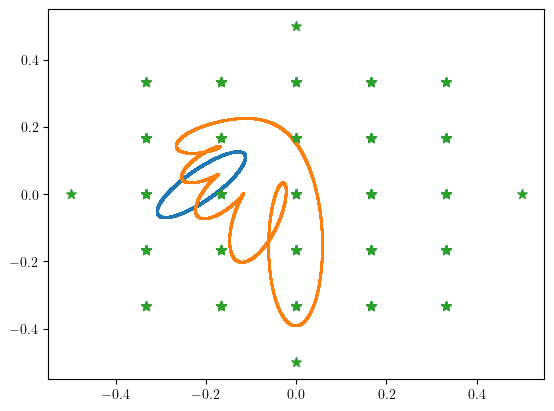

In [47]:
fig, ax = plt.subplots(1,1)
for i in range(1,2):
    ax.scatter(trajs[i,1,:],trajs[i,2,:])
ax.scatter(starts[:,0],starts[:,1],s=50,marker="*")

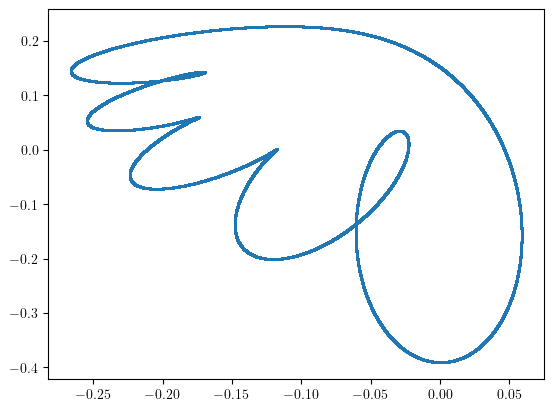

In [63]:
traj = solve_ivp(gl2,(0,10**5),y0=trajs[1,1:,0],args=(wval,kval,dval,1,0.2),method='LSODA',t_eval=np.linspace(4.5*10**4,5*10**4,5*10**5),rtol=1e-10)
plt.figure()
plt.scatter(traj.y[0,:],traj.y[1,:])
plt.show()

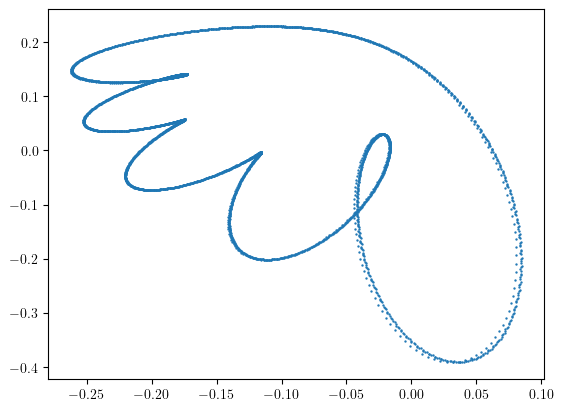

In [ ]:
plt.figure()
plt.scatter(traj.y[0,-4000:],traj.y[1,-4000:])
plt.show()

In [4]:
# start_p = np.row_stack((w_traj[12,29,0,0,1:],w_traj[12,29,4,0,1:],w_traj[12,29,3,0,1:]))
# np.save('start_points_for_k10.53_w2.389_d-1.96',start_p)
start_p = np.load('start_points_for_k10.53_w2.389_d-1.96.npy')

In [19]:
gridpoints = 54
# from scipy.integrate import ode
k = np.linspace(9.751111111111111, 13.0,gridpoints)
d = np.linspace(-3.0, -1.2,gridpoints)
w = 2.3889
wval = w
kval = k[12]
dval = d[29]
# solver = ode
# solver.set_integrator(solver,name='zvode')
# traj0 = solve_ivp(gl2,(0,10**6),y0=start_p[0,:],args=(wval,kval,dval,1,0.2),method='LSODA',t_eval=np.linspace(9.95*10**5,10**6,10*10**5))

traj1 = solve_ivp(gl2,(0,5*10**5),y0=start_p[2,:],args=(wval,kval,dval,1,0.2),method='LSODA',t_eval=np.linspace(14.5*10**4,5*10**5,8*10**5))

# traj2_row = solve_ivp(gl2,(0,10**5),y0=traj2[1:,-1800],args=(wval,kval,dval,1,0.2),method='LSODA',t_eval=np.linspace(9.5*10**4,10**5,8*10**5))

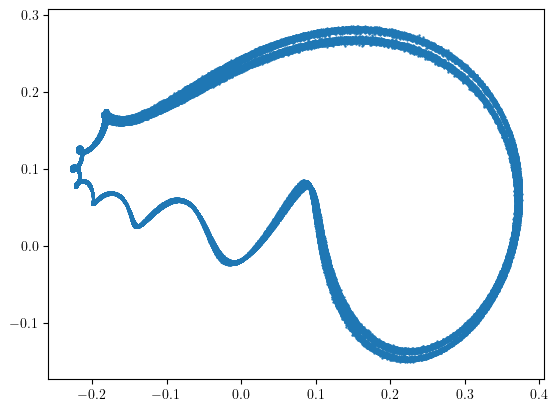

In [22]:
plt.figure()
plt.scatter(traj1.y[0,:],traj1.y[2,:])
plt.show()

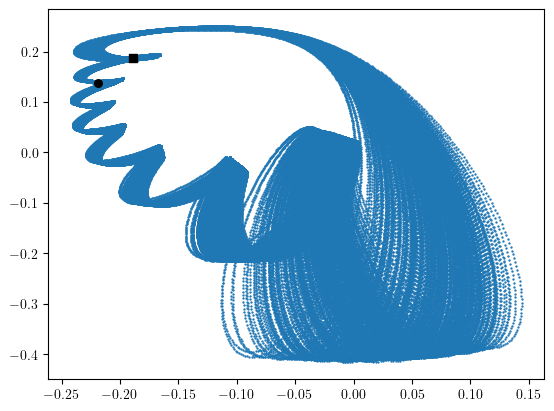

In [15]:
plt.figure()
end = -1800
plt.scatter(traj2[1,:],traj2[2,:])
plt.scatter(traj2[1,end],traj2[2,end],s=30,color='0')
plt.scatter(start_p[2,0],start_p[2,1],s=30,color='0',marker='s')
plt.show()

In [8]:
traj25 = np.row_stack((traj2.t,traj2.y))
# traj1[0,0], traj1.shape, traj2.shape

In [27]:
# trajs = np.stack((traj0,traj1,traj2),axis=2)
# np.save('trajs_10e6_iter_k10.53_w2.389_d-1.96',trajs)

trajs5 = np.load('trajs_10e5_iter_k10.53_w2.389_d-1.96.npy')
trajs5.shape
traj05 = trajs5[:,:,0]
traj15 = trajs5[:,:,1]
traj25 = trajs5[:,:,2]

In [14]:
trajs = np.load('trajs_10e6_iter_k10.53_w2.389_d-1.96.npy')
print(trajs.shape)
traj0 = trajs[:,:,0]
traj1 = trajs[:,:,1]
traj2 = trajs[:,:,2]

(4, 1000000, 3)


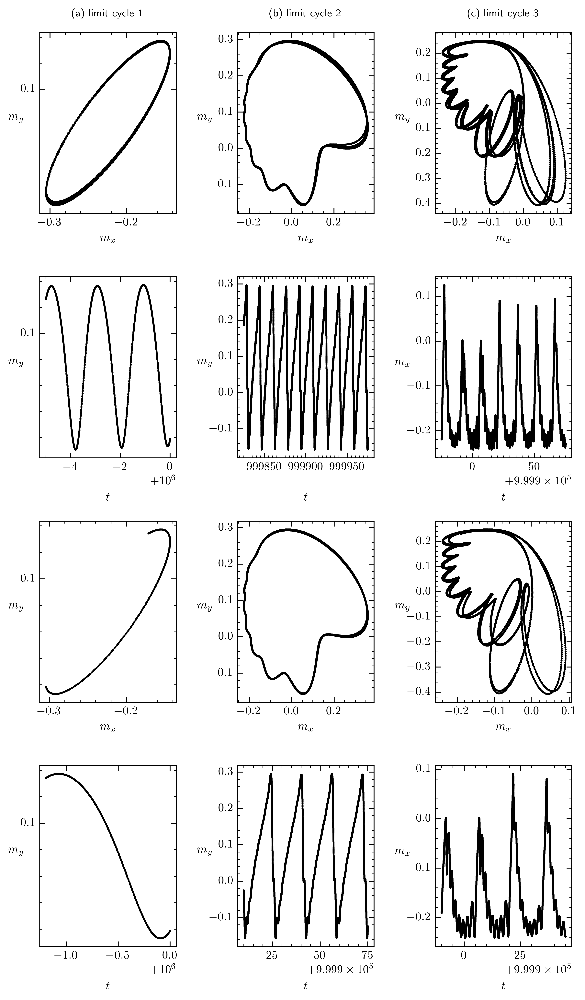

In [10]:
tickp = TickProperties(xtick_step_major=0.1,\
                        xtick_step_minor=0.02,\
                            ytick_step_major=0.1,\
                                ytick_step_minor=0.02)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp)
# traj2 = traj
# traj2= np.row_stack((traj2.t,traj2.y))
# traj1= np.row_stack((traj1.t,traj1.y))
# traj0= np.row_stack((traj0.t,traj0.y))
titles = ['(a) limit cycle 1', '(b) limit cycle 2', '(c) limit cycle 3']
setup.fig_width= 20.6*cm
setup.fig_height=35.6*cm 
fig, ax = setup.return_fig(shape=(4,3),dots_per_inch=600,set_ticks=False)
plotst = [traj0[:,-1000:],traj1[:,-35000:-5000],traj2[:,-25000:-5000]]
# plotst = [traj0,traj1,traj2]
plotsy = [traj0[:,-240:],traj1[:,-18000:-5000],traj2[:,-22000:-11000]]
xpad = 17
for i in range(3):
    if i ==2:
        ax[1,i].scatter(plotst[i][0,:],plotst[i][1,:],color='0')
        ax[1,i].set_ylabel(r'$m_x$',rotation=0)
    else:
        ax[1,i].scatter(plotst[i][0,:],plotst[i][2,:],color='0')
        ax[1,i].set_ylabel(r'$m_y$',rotation=0)
    ax[1,i].xaxis.set_minor_locator(ticker.MultipleLocator(5))
    ax[1,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[1,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[1,i].set_xlabel(r'$t$',labelpad=xpad)
    
    ax[0,i].scatter(plotst[i][1,:],plotst[i][2,:],color='0')
    ax[0,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[0,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[0,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    ax[0,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[0,i].set_xlabel(r'$m_x$')
    ax[0,i].set_ylabel(r'$m_y$',rotation=0)
    ax[0,i].set_title(titles[i],loc='center',y=1.05,fontsize=9)
    if i==1:
        ax[0,1].xaxis.set_major_locator(ticker.MultipleLocator(0.2))
        ax[0,1].xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    ax[2,i].scatter(plotsy[i][1,:],plotsy[i][2,:],color='0')
    ax[2,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[2,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[2,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    ax[2,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[2,i].set_xlabel(r'$m_x$')
    ax[2,i].set_ylabel(r'$m_y$',rotation=0)
    # ax[2,i].set_title(titles[i],loc='center',y=-0.25,fontsize=9)
    if i==1:
        ax[2,1].xaxis.set_major_locator(ticker.MultipleLocator(0.2))
        ax[2,1].xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    if i ==2:
        ax[3,i].scatter(plotsy[i][0,:],plotsy[i][1,:],color='0')
        ax[3,i].set_ylabel(r'$m_x$',rotation=0)
    else:
        ax[3,i].scatter(plotsy[i][0,:],plotsy[i][2,:],color='0')
        ax[3,i].set_ylabel(r'$m_y$',rotation=0)
    ax[3,i].xaxis.set_minor_locator(ticker.MultipleLocator(5))
    ax[3,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[3,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[3,i].set_xlabel(r'$t$',labelpad=xpad)
    
plt.subplots_adjust(wspace=0.45,hspace=0.35)              
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'limit_cycle_10e6iter_k10.53_w2.389_d-1.96.pdf',bbox_inches='tight')
plt.show()

<class 'numpy.ndarray'>


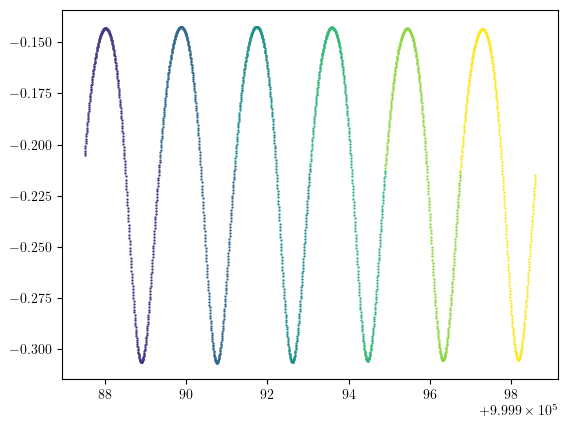

In [11]:
from matplotlib import colormaps
def search_period(traj,tol):  
    start = 0
    for j in range(20,traj.shape[1]):
    # print(np.linalg.norm(traj[:,0]-traj[:,j]))
        if np.linalg.norm(traj[:,start]-traj[:,j])<tol:
            return j
    return 

def slice_period(traj):
    p = search_period(traj[1:,:],5*1e-3)
    if not p:
        period = 10
    else:
        period = traj[0,p]- traj[0,0]
    slices = []
    t1 = traj[0,0]
    j1 = 0
    for j in range(1,traj.shape[1]):
        if traj[0,j]-t1>=period:
            slices.append(traj[:,j1:j])
            j1 =j
            t1= traj[0,j]
    return slices
def plot_tmap(ax,traj,xax,yax):
    data = slice_period(traj)
    painting = ['red','blue','green','yellow','orange','purple']
    alphas = np.arange(start=1,stop=len(data)+1)/len(data)
    cmap = colormaps['viridis'](alphas)
    print(type(cmap))
    for i in range(len(data)):
        ax.scatter(data[i][xax,:],data[i][yax,:],color=cmap[i])#,color="{:.2f}".format(alphas[i]))

fig, ax = plt.subplots(1,1)
# dat = slice_period(traj0[:,-2500:])
plot_tmap(ax,traj0[:,-2500:],0,1)
plt.show()

In [12]:
def search_period(traj,tol):  
    start = 0
    for j in range(20,traj.shape[1]):
    # print(np.linalg.norm(traj[:,0]-traj[:,j]))
        if np.linalg.norm(traj[:,start]-traj[:,j])<tol:
            return j
    return 
search_period(traj0[1:,-2500:],5*1e-3)

370

In [30]:
def end_time(traj,t):
    # print(t)
    for i in range(traj.shape[1]):
        # print(traj[0,-1-i])
        if traj[0,-1-i]<=t:
            return -1-i
        

def start_time(traj,traj_ref,endtime=None):
    # print(traj_ref.shape)
    delt = traj_ref[0,-1]-traj_ref[0,0]
    # print(endtime,traj[0,0])
    if endtime:
        end_ind= end_time(traj,endtime)
        # print(end_ind)
        endt = traj[0,end_ind]
    else:
        end_ind = -1
        endt = traj[0,-1]
    for i in range(traj.shape[1]):
        # print(endt, traj[0,-1-i],delt)
        if endt-traj[0,-1-i]>=delt:
            return traj[:,-1-i:end_ind]

tickp = TickProperties(xtick_step_major=0.1,\
                        xtick_step_minor=0.02,\
                            ytick_step_major=0.1,\
                                ytick_step_minor=0.02)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp)
# traj2 = traj
# traj2= np.row_stack((traj2.t,traj2.y))
# traj1= np.row_stack((traj1.t,traj1.y))
# traj0= np.row_stack((traj0.t,traj0.y))
titles = ['(a) limit cycle 1', '(b) limit cycle 2', '(c) limit cycle 3']
setup.fig_width= 20.6*cm
setup.fig_height=27.6*cm 
fig, ax = setup.return_fig(shape=(5,3),dots_per_inch=1200,set_ticks=False)
plotst = [traj0[:,-2500:],traj1[:,-35000:-5000],traj2[:,-25000:-5000]]
# plotst = [traj0,traj1,traj2]
t2 = traj2[:,-300000:-5000]
plot3 = [start_time(traj0,t2,endtime=t2[0,-1]),start_time(traj1,t2,endtime=t2[0,-1]),t2]
t3 = traj25[:,-22500:-5000]
plot2 = [start_time(traj05,t3,endtime=t3[0,-1]),start_time(traj15,t3,endtime=t3[0,-1]),t3]
xpad = 17
for i in range(3):
    if i ==2:
        ax[1,i].scatter(plotst[i][0,:],plotst[i][1,:],color='0')
        ax[1,i].set_ylabel(r'$m_x$',rotation=0)
    else:
        ax[1,i].scatter(plotst[i][0,:],plotst[i][2,:],color='0')
        ax[1,i].set_ylabel(r'$m_y$',rotation=0)
    ax[1,i].xaxis.set_minor_locator(ticker.MultipleLocator(5))
    ax[1,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[1,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[1,i].set_xlabel(r'$t$',labelpad=xpad)
    
    ax[0,i].scatter(plotst[i][1,:],plotst[i][2,:],color='0')
    ax[0,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[0,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[0,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    ax[0,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[0,i].set_xlabel(r'$m_x$')
    ax[0,i].set_ylabel(r'$m_y$',rotation=0)
    ax[0,i].set_title(titles[i],loc='center',y=1.05,fontsize=9)
    if i==1:
        ax[0,1].xaxis.set_major_locator(ticker.MultipleLocator(0.2))
        ax[0,1].xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    ax[2,i].scatter(plot2[i][1,:],plot2[i][2,:],color='0')
    ax[2,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[2,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[2,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    ax[2,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[2,i].set_xlabel(r'$m_x$')
    ax[2,i].set_ylabel(r'$m_y$',rotation=0)
    # ax[2,i].set_title(titles[i],loc='center',y=-0.25,fontsize=9)
    if i==1:
        ax[2,1].xaxis.set_major_locator(ticker.MultipleLocator(0.2))
        ax[2,1].xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    # if i ==2:
    #     ax[3,i].scatter(plotsy[i][0,:],plotsy[i][1,:],color='0')
    #     ax[3,i].set_ylabel(r'$m_x$',rotation=0)
    # else:
    #     ax[3,i].scatter(plotsy[i][0,:],plotsy[i][2,:],color='0')
    #     ax[3,i].set_ylabel(r'$m_y$',rotation=0)
    # ax[3,i].xaxis.set_minor_locator(ticker.MultipleLocator(5))
    # ax[3,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    # ax[3,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    # ax[3,i].set_xlabel(r'$t$',labelpad=xpad)
    plot_tmap(ax[3,i],plot3[i],1,2)
    # ax[3,i].scatter(plot3[i][1,:],plot3[i][2,:],color='0')
    ax[3,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[3,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[3,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    ax[3,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[3,i].set_xlabel(r'$m_x$')
    ax[3,i].set_ylabel(r'$m_y$',rotation=0)
    # ax[3,i].set_title(titles[i],loc='center',y=-0.25,fontsize=9)
    if i==1:
        ax[3,1].xaxis.set_major_locator(ticker.MultipleLocator(0.2))
        ax[3,1].xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    plot_tmap(ax[4,i],plot3[i],0,1)
    # ax[4,i].scatter(plot3[i][1,:],plot3[i][2,:],color='0')
    # ax[4,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    # ax[4,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    # ax[4,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    # ax[4,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[4,i].set_xlabel(r'$t$')
    ax[4,i].set_ylabel(r'$m_x$',rotation=0)
    # ax[4,i].set_title(titles[i],loc='center',y=-0.25,fontsize=9)
xcap = -0.455
ycap = 0.15
ax[3,0].text(xcap,ycap,r'\,\\\bf{time interval}'+r'\\$\bf{'+'({:.3f}-{:.0f})'.format(t2[0,0]/10**5,t2[0,-1]/10**5)+r'\cdot10^{-5}}$',fontsize=10)
# xcap = -0.5
# ycap = 0.1
ax[2,0].text(xcap,ycap,r'\,\\\bf{time interval}'+r'\\$\bf{'+'({:.3f}-{:.0f})'.format(t3[0,0]/10**4,t3[0,-1]/10**4)+r'\cdot10^{-4}}$',fontsize=10)
plt.subplots_adjust(wspace=0.45,hspace=0.35)              
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'limit_cycle_10e6iter_k10.53_w2.389_d-1.96_aperiodicity_color.png',bbox_inches='tight')
plt.show()

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


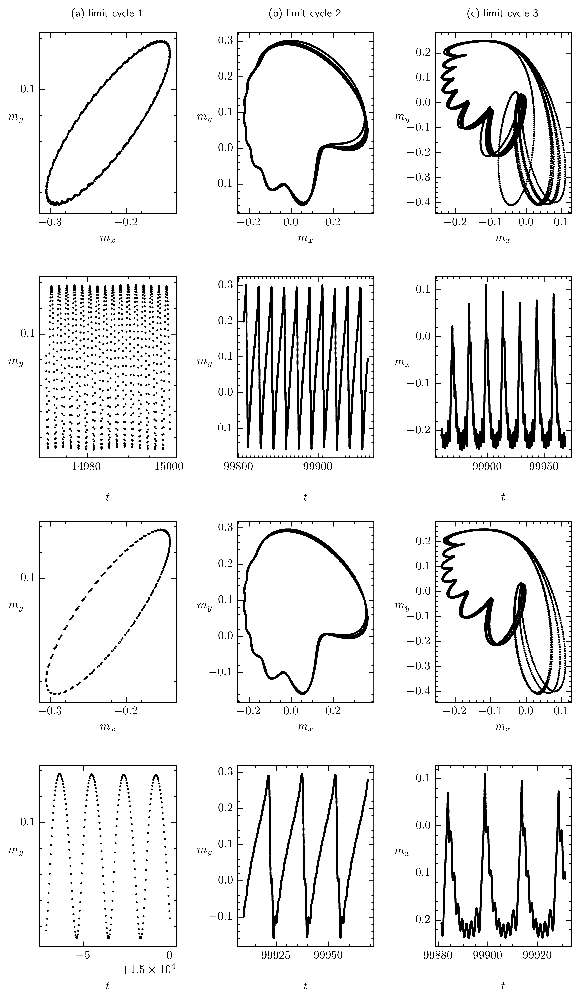

In [ ]:
tickp = TickProperties(xtick_step_major=0.1,\
                        xtick_step_minor=0.02,\
                            ytick_step_major=0.1,\
                                ytick_step_minor=0.02)
setup = Setup_Fig(name_of_plot='lam2_anal_ml.png',tickp=tickp)
# traj2 = traj
# traj2= np.row_stack((traj2.t,traj2.y))
# traj1= np.row_stack((traj1.t,traj1.y))
# traj0= np.row_stack((traj0.t,traj0.y))
titles = ['(a) limit cycle 1', '(b) limit cycle 2', '(c) limit cycle 3']
setup.fig_width= 20.6*cm
setup.fig_height=35.6*cm 
fig, ax = setup.return_fig(shape=(4,3),dots_per_inch=600,set_ticks=False)
plotst = [traj0[:,-1000:],traj15[:,-31000:-6000],traj25[:,-22500:-5000]]
# plotst = [traj0,traj1,traj2]
plotsy = [traj0[:,-240:],traj15[:,-14500:-5000],traj25[:,-19000:-11000]]
xpad = 17
for i in range(3):
    if i ==2:
        ax[1,i].scatter(plotst[i][0,:],plotst[i][1,:],color='0')
        ax[1,i].set_ylabel(r'$m_x$',rotation=0)
    else:
        ax[1,i].scatter(plotst[i][0,:],plotst[i][2,:],color='0')
        ax[1,i].set_ylabel(r'$m_y$',rotation=0)
    ax[1,i].xaxis.set_minor_locator(ticker.MultipleLocator(5))
    ax[1,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[1,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[1,i].set_xlabel(r'$t$',labelpad=xpad)
    
    ax[0,i].scatter(plotst[i][1,:],plotst[i][2,:],color='0')
    ax[0,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[0,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[0,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    ax[0,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[0,i].set_xlabel(r'$m_x$')
    ax[0,i].set_ylabel(r'$m_y$',rotation=0)
    ax[0,i].set_title(titles[i],loc='center',y=1.05,fontsize=9)
    if i==1:
        ax[0,1].xaxis.set_major_locator(ticker.MultipleLocator(0.2))
        ax[0,1].xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    ax[2,i].scatter(plotsy[i][1,:],plotsy[i][2,:],color='0')
    ax[2,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[2,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[2,i].xaxis.set_major_locator(ticker.MultipleLocator(tickp.major_xtick_step))
    ax[2,i].xaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_xtick_step))
    ax[2,i].set_xlabel(r'$m_x$')
    ax[2,i].set_ylabel(r'$m_y$',rotation=0)
    # ax[2,i].set_title(titles[i],loc='center',y=-0.25,fontsize=9)
    if i==1:
        ax[2,1].xaxis.set_major_locator(ticker.MultipleLocator(0.2))
        ax[2,1].xaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    if i ==2:
        ax[3,i].scatter(plotsy[i][0,:],plotsy[i][1,:],color='0')
        ax[3,i].set_ylabel(r'$m_x$',rotation=0)
    else:
        ax[3,i].scatter(plotsy[i][0,:],plotsy[i][2,:],color='0')
        ax[3,i].set_ylabel(r'$m_y$',rotation=0)
    ax[3,i].xaxis.set_minor_locator(ticker.MultipleLocator(5))
    ax[3,i].yaxis.set_minor_locator(ticker.MultipleLocator(tickp.minor_ytick_step))
    ax[3,i].yaxis.set_major_locator(ticker.MultipleLocator(tickp.major_ytick_step))
    ax[3,i].set_xlabel(r'$t$',labelpad=xpad)
    
plt.subplots_adjust(wspace=0.45,hspace=0.35)              
# plt.savefig('/home/christian/Documents/Bachelor/protocol/pictures/'+'limit_cycle_10e5iter_k10.53_w2.389_d-1.96.pdf',bbox_inches='tight')
plt.show()